In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import os
import copy
import warnings

import scipy
import scipy.integrate as integrate
from scipy import interpolate

import numpy as np 

from astropy.io import fits
from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.table import Table, QTable, vstack

import matplotlib.pyplot as plt

from astroquery.gaia import Gaia

In [2]:
# Directory to the stellar locus model data 

model_dir = './'

# Gunn Skyker and Pickles models
gs_sum = Table.read(os.path.join(model_dir, 'gunn_stryker_sum.fits'))
pk_sum = Table.read(os.path.join(model_dir, 'pickles_sum.fits'))

print(len(gs_sum), len(pk_sum))

149 131


In [3]:
# Test data 

data_dir = './'

#merian_cat = Table.read(os.path.join(data_dir, 'meriandr1_use_8524_S20A.fits'))
merian_cat = Table.read(os.path.join(data_dir, 'meriandr1_use_9813_S20A.fits'))
print(len(merian_cat))

423785


In [57]:
# This class is used to generate the star_catalog_use.
# Method to change the blendness threshold and update the catalog.
# Method to calculate color with input filter names and mantain a dictioinary.
# Method to apply extra flag.

class MerianPhotocal:
    def __init__(self, merian_cat, blended_threshold=0.02):
        self.merian_cat = merian_cat
        self.blended_threshold = blended_threshold 
        self.gaia_cat = None
        self.flag=None
        self.basic_flags = {}
        #self.extra_flags = {}
        self.extra_flag_applied = False
        self.star_catalog_use = None
        self.star_catalog_use_basic = None
        self.magnitudes = {}
        self.colors = {}

        self.__match_gaia__()
        self.__good_sources_flag__()
        self.__star_catalog_use__()
        self.__correct_ext__()
    
    def __match_gaia__(self):
        # Get the RA, Dec range of the Merian catalog
        ra_min = np.min(self.merian_cat['coord_ra_Merian'])
        ra_max = np.max(self.merian_cat['coord_ra_Merian'])
        dec_min = np.min(self.merian_cat['coord_dec_Merian'])
        dec_max = np.max(self.merian_cat['coord_dec_Merian'])

        print("RA Range: ", ra_min, " - ", ra_max)
        print("Dec Range: ", dec_min, " - ", dec_max)

        # Get the coordinate of the center of the Merian catalog and the width of the catalog in the RA and Dec directions
        ra_center = 0.5 * (ra_min + ra_max)
        dec_center = 0.5 * (dec_min + dec_max)
        center_coord = SkyCoord(ra=ra_center*u.degree, dec=dec_center*u.degree, frame='icrs')

        ra_width = u.Quantity((ra_max - ra_min) + 0.01, u.deg)
        dec_width = u.Quantity((dec_max - dec_min) + 0.01, u.deg)

        # Query the Gaia DR3 source catalog to get the stars in the region of the Merian catalog
        Gaia.ROW_LIMIT = -1
        self.gaia_cat = Gaia.query_object_async(coordinate=center_coord, width=ra_width, height=dec_width)
        
        print("Number of Gaia stars:", len(self.gaia_cat))
        
    def __good_sources_flag__(self):
        # Try to identify isolated, high S/N point sources for calibration 
        # Basic quality cuts from the Merian side
        # Primary detection & not skipped during deblending
        merian_basic_flag = self.merian_cat['detect_isPrimary_Merian'] & ~self.merian_cat['deblend_skipped_Merian'] & \
                            (self.merian_cat['SciUse'] > 0) & (self.merian_cat['IsMask_Merian'] <1)
        print(merian_basic_flag.sum() / len(self.merian_cat))

        # Merian basic photometric cut:
        # 1. Flux is possitive 
        # 2. Flux error is possitive
        # 3. S/N > 5
        merian_basic_phot = (self.merian_cat['N708_gaap1p0Flux_Merian'] > 0) & (self.merian_cat['N708_gaap1p0FluxErr_Merian'] > 0) & \
                            (self.merian_cat['N540_gaap1p0Flux_Merian'] > 0) & (self.merian_cat['N540_gaap1p0FluxErr_Merian'] > 0) & \
                            (self.merian_cat['N708_gaap1p0Flux_Merian'] / self.merian_cat['N708_gaap1p0FluxErr_Merian'] > 5) & \
                            (self.merian_cat['N540_gaap1p0Flux_Merian'] / self.merian_cat['N540_gaap1p0FluxErr_Merian'] > 5)
        print(merian_basic_phot.sum() / len(self.merian_cat))

        # Matched with HSC and with useful photometry. Same rules, but applied to HSC bands.
        hsc_basic_flag = (self.merian_cat['hsc_match'] > 0) & (self.merian_cat['IsMask_HSCS20A'] <1)
        print(hsc_basic_flag.sum() / len(self.merian_cat))

        hsc_basic_phot = (self.merian_cat['g_gaap1p0Flux_Merian'] > 0) & (self.merian_cat['g_gaap1p0FluxErr_Merian'] > 0) & \
                         (self.merian_cat['r_gaap1p0Flux_Merian'] > 0) & (self.merian_cat['r_gaap1p0FluxErr_Merian'] > 0) & \
                         (self.merian_cat['i_gaap1p0Flux_Merian'] > 0) & (self.merian_cat['i_gaap1p0FluxErr_Merian'] > 0) & \
                         (self.merian_cat['z_gaap1p0Flux_Merian'] > 0) & (self.merian_cat['z_gaap1p0FluxErr_Merian'] > 0) & \
                         (self.merian_cat['y_gaap1p0Flux_Merian'] > 0) & (self.merian_cat['y_gaap1p0FluxErr_Merian'] > 0) & \
                         (self.merian_cat['g_gaap1p0Flux_Merian'] / self.merian_cat['g_gaap1p0FluxErr_Merian'] > 5) & \
                         (self.merian_cat['r_gaap1p0Flux_Merian'] / self.merian_cat['r_gaap1p0FluxErr_Merian'] > 5) & \
                         (self.merian_cat['i_gaap1p0Flux_Merian'] / self.merian_cat['i_gaap1p0FluxErr_Merian'] > 5) & \
                         (self.merian_cat['z_gaap1p0Flux_Merian'] / self.merian_cat['z_gaap1p0FluxErr_Merian'] > 5) & \
                         (self.merian_cat['y_gaap1p0Flux_Merian'] / self.merian_cat['y_gaap1p0FluxErr_Merian'] > 5) & \
                         (self.merian_cat['g_gaap1p0Flux_aperCorr_Merian'] > 0) & \
                         (self.merian_cat['r_gaap1p0Flux_aperCorr_Merian'] > 0) & \
                         (self.merian_cat['i_gaap1p0Flux_aperCorr_Merian'] > 0) & \
                         (self.merian_cat['z_gaap1p0Flux_aperCorr_Merian'] > 0) & \
                         (self.merian_cat['y_gaap1p0Flux_aperCorr_Merian'] > 0)
        print(hsc_basic_phot.sum() / len(self.merian_cat))

        # HSC blendedness cut 
        # Need a threshold value for the blendedness 
        # Only use r- and i-band blendedness cuts
        hsc_blended_cut = (~self.merian_cat['g_blendedness_flag_HSCS20A']) & (~self.merian_cat['r_blendedness_flag_HSCS20A']) & \
                          (~self.merian_cat['i_blendedness_flag_HSCS20A']) & (~self.merian_cat['z_blendedness_flag_HSCS20A']) & \
                          (~self.merian_cat['y_blendedness_flag_HSCS20A']) & \
                          (self.merian_cat['r_blendedness_abs_HSCS20A'] < self.blended_threshold) & \
                          (self.merian_cat['i_blendedness_abs_HSCS20A'] < self.blended_threshold)
        print(hsc_blended_cut.sum() / len(self.merian_cat))

        # HSC extendedness cut
        # Extendedness in HSC is now still 0 or 1; 0 is for point source.
        hsc_extended_cut = (self.merian_cat['g_extendedness_value_HSCS20A'] < 0.1) & \
                           (self.merian_cat['r_extendedness_value_HSCS20A'] < 0.1) & \
                           (self.merian_cat['i_extendedness_value_HSCS20A'] < 0.1) & \
                           (self.merian_cat['z_extendedness_value_HSCS20A'] < 0.1) & \
                           (self.merian_cat['y_extendedness_value_HSCS20A'] < 0.1)
        print(hsc_extended_cut.sum() / len(self.merian_cat))

        # Combine all the cuts
        self.flag = merian_basic_flag & merian_basic_phot & hsc_basic_flag & hsc_basic_phot & hsc_blended_cut & hsc_extended_cut
        print(self.flag.sum() / len(self.merian_cat))
        
        self.basic_flags={'merian_basic_flag':merian_basic_flag,'merian_basic_phot':merian_basic_phot,\
                             'hsc_basic_flag':hsc_basic_flag,'hsc_basic_phot':hsc_basic_phot,\
                             'hsc_blended_cut':hsc_blended_cut,'hsc_extended_cut':hsc_extended_cut}
        
    def __star_catalog_use__(self):
        # Possible calibration stars 
        star_catalog = self.merian_cat[self.flag]
        print(len(star_catalog))

        # Cross-match between the Gaia and Merian catalogs to identify the stars in the Gaia catalog
        star_catalog['coord_ra_Merian'].unit = u.deg
        star_catalog['coord_dec_Merian'].unit = u.deg

        star_coords = SkyCoord(
            ra=star_catalog['coord_ra_Merian'], 
            dec=star_catalog['coord_dec_Merian']
        )

        gaia_coords = SkyCoord(
            ra=self.gaia_cat['ra'], 
            dec=self.gaia_cat['dec']
        )
        
        idx_gaia, sep2d_gaia, _ = gaia_coords.match_to_catalog_sky(star_coords)

        # Only use the stars with small separation and not in qso/galaxy candidates.
        idx_gaia_use = idx_gaia[(sep2d_gaia.arcsec < 0.1) & \
                                (~self.gaia_cat['in_qso_candidates']) & \
                                (~self.gaia_cat['in_galaxy_candidates'])
                               ]
        print(len(idx_gaia_use))
        
        # Define a "good" star catalog
        self.star_catalog_use = star_catalog[idx_gaia_use]
        self.star_catalog_use_basic = self.star_catalog_use.copy()
        
        plt.scatter(star_catalog['coord_ra_Merian'], star_catalog['coord_dec_Merian'], s=6, marker='o', facecolor='none', edgecolor='r')
        plt.scatter(self.star_catalog_use['coord_ra_Merian'], self.star_catalog_use['coord_dec_Merian'], s=5, marker='+', color='b')
        plt.show()
        print(len(self.star_catalog_use))
        
    def __correct_ext__(self):
        # Galactic extinction coefficients 
        # See galactic_extinction_coefficient.ipynb for details
        n708_extinction_coeff = 1.847
        n540_extinction_coeff = 2.753
        g_extinction_coeff = 3.234
        r_extinction_coeff = 2.277
        i_extinction_coeff = 1.637
        z_extinction_coeff = 1.268
        y_extinction_coeff = 1.084

        n708_extinction_corr = self.star_catalog_use['ebv_Merian'] * n708_extinction_coeff
        n540_extinction_corr = self.star_catalog_use['ebv_Merian'] * n540_extinction_coeff
        g_extinction_corr = self.star_catalog_use['ebv_Merian'] * g_extinction_coeff
        r_extinction_corr = self.star_catalog_use['ebv_Merian'] * r_extinction_coeff
        i_extinction_corr = self.star_catalog_use['ebv_Merian'] * i_extinction_coeff
        z_extinction_corr = self.star_catalog_use['ebv_Merian'] * z_extinction_coeff
        y_extinction_corr = self.star_catalog_use['ebv_Merian'] * y_extinction_coeff
        
        # Convert the fluxes used for calibration into magnitudes and perform extinction correction 
        merian_zp = hsc_zp = 27.0

        star_n540 = -2.5 * np.log10(self.star_catalog_use['N540_gaap1p0Flux_Merian']) + merian_zp - n540_extinction_corr
        star_n708 = -2.5 * np.log10(self.star_catalog_use['N708_gaap1p0Flux_Merian']) + merian_zp - n708_extinction_corr
        star_n540_err = 2.5 / np.log(10) * (self.star_catalog_use['N540_gaap1p0FluxErr_Merian'] / self.star_catalog_use['N540_gaap1p0Flux_Merian'])
        star_n708_err = 2.5 / np.log(10) * (self.star_catalog_use['N708_gaap1p0FluxErr_Merian'] / self.star_catalog_use['N708_gaap1p0Flux_Merian'])

        star_hsc_g = -2.5 * np.log10(self.star_catalog_use['g_gaap1p0Flux_aperCorr_Merian']) + hsc_zp - g_extinction_corr
        star_hsc_r = -2.5 * np.log10(self.star_catalog_use['r_gaap1p0Flux_aperCorr_Merian']) + hsc_zp - r_extinction_corr
        star_hsc_i = -2.5 * np.log10(self.star_catalog_use['i_gaap1p0Flux_aperCorr_Merian']) + hsc_zp - i_extinction_corr
        star_hsc_z = -2.5 * np.log10(self.star_catalog_use['z_gaap1p0Flux_aperCorr_Merian']) + hsc_zp - z_extinction_corr
        star_hsc_y = -2.5 * np.log10(self.star_catalog_use['y_gaap1p0Flux_aperCorr_Merian']) + hsc_zp - y_extinction_corr
        star_hsc_g_err = 2.5 / np.log(10) * (self.star_catalog_use['g_gaap1p0FluxErr_Merian'] / self.star_catalog_use['g_gaap1p0Flux_aperCorr_Merian'])
        star_hsc_r_err = 2.5 / np.log(10) * (self.star_catalog_use['r_gaap1p0FluxErr_Merian'] / self.star_catalog_use['r_gaap1p0Flux_aperCorr_Merian'])
        star_hsc_i_err = 2.5 / np.log(10) * (self.star_catalog_use['i_gaap1p0FluxErr_Merian'] / self.star_catalog_use['i_gaap1p0Flux_aperCorr_Merian'])
        star_hsc_z_err = 2.5 / np.log(10) * (self.star_catalog_use['z_gaap1p0FluxErr_Merian'] / self.star_catalog_use['z_gaap1p0Flux_aperCorr_Merian'])
        star_hsc_y_err = 2.5 / np.log(10) * (self.star_catalog_use['y_gaap1p0FluxErr_Merian'] / self.star_catalog_use['y_gaap1p0Flux_aperCorr_Merian'])
        
        self.magnitudes = {
        'star_n540': star_n540, 'star_n540_err': star_n540_err,
        'star_n708': star_n708, 'star_n708_err': star_n708_err,
        'star_hsc_g': star_hsc_g, 'star_hsc_g_err': star_hsc_g_err,
        'star_hsc_r': star_hsc_r, 'star_hsc_r_err': star_hsc_r_err,
        'star_hsc_i': star_hsc_i, 'star_hsc_i_err': star_hsc_i_err,
        'star_hsc_z': star_hsc_z, 'star_hsc_z_err': star_hsc_z_err,
        'star_hsc_y': star_hsc_y, 'star_hsc_y_err': star_hsc_y_err
    }
        
    def cal_color(self,f1,f2):
        name = f'{f1}-{f2}'
        if name in self.colors:
            return self.colors[name],self.colors[name+'_err']

        mag1 = self.magnitudes[f'star_hsc_{f1}'] if f1 in ('g', 'r', 'i', 'z', 'y') else self.magnitudes[f'star_{f1}']
        mag2 = self.magnitudes[f'star_hsc_{f2}'] if f2 in ('g', 'r', 'i', 'z', 'y') else self.magnitudes[f'star_{f2}']
        err1 = self.magnitudes[f'star_hsc_{f1}_err'] if f1 in ('g', 'r', 'i', 'z', 'y') else self.magnitudes[f'star_{f1}_err']
        err2 = self.magnitudes[f'star_hsc_{f2}_err'] if f2 in ('g', 'r', 'i', 'z', 'y') else self.magnitudes[f'star_{f2}_err']
        
        color = mag1 - mag2
        color_err = np.sqrt(err1**2 + err2**2)
        self.colors[name] = color
        self.colors[name+'_err'] = color_err
        return color,color_err
    
    def blended_cut(self,blended_threshold): # Change blended_threshold and update attributes
        self.blended_threshold=blended_threshold
        hsc_blended_cut = (~self.merian_cat['g_blendedness_flag_HSCS20A']) & (~self.merian_cat['r_blendedness_flag_HSCS20A']) & \
                          (~self.merian_cat['i_blendedness_flag_HSCS20A']) & (~self.merian_cat['z_blendedness_flag_HSCS20A']) & \
                          (~self.merian_cat['y_blendedness_flag_HSCS20A']) & \
                          (self.merian_cat['r_blendedness_abs_HSCS20A'] < self.blended_threshold) & \
                          (self.merian_cat['i_blendedness_abs_HSCS20A'] < self.blended_threshold)
        # Update self.basic_flags
        self.basic_flags['hsc_blended_cut']=hsc_blended_cut
        
        # Update self.flag based on all available flags
        flag=np.ones(len(self.merian_cat),dtype=bool)
        for key,value in self.basic_flags.items():
            flag&=value
        self.flag=flag
        
        # Update other attributes affected by flag changes
        self.__star_catalog_use__()
        self.__correct_ext__()
        self.colors={}  # Clear cached colors after flag update
        
    def apply_extra_flag(self,flag):
        self.remove_extra_flag()
        self.star_catalog_use=self.star_catalog_use[flag]
        self.__correct_ext__()
        self.colors={}  # Clear cached colors after flag update
        self.extra_flag_applied = True
    
    def remove_extra_flag(self):
        self.star_catalog_use=self.star_catalog_use_basic.copy()
        self.__correct_ext__()
        self.colors={}  # Clear cached colors after flag update
        self.extra_flag_applied = False

In [14]:
class StellarLocusPlotter:
    def __init__(self):
        self.color_1 = None
        self.color_2 = None
        self.color_err_1 = None
        self.color_err_2 = None
        self.pk_color_1 = None
        self.pk_color_2 = None

    def pk_mag(self, f):
        if f in ('n540', 'n708'):
            return pk_sum[f'merian_{f}_med_ab']
        elif f in ('g', 'r', 'i', 'z', 'y'):
            return pk_sum[f'hsc_{f}_ab']

    def plot_stellar_locus(self, f, merian_photocal):
        f = f.split()
        self.color_1, self.color_err_1 = merian_photocal.cal_color(f[0], f[1])
        self.color_2, self.color_err_2 = merian_photocal.cal_color(f[2], f[3])
        self.pk_color_1 = self.pk_mag(f[0]) - self.pk_mag(f[1])
        self.pk_color_2 = self.pk_mag(f[2]) - self.pk_mag(f[3])

        fig, ax1 = plt.subplots(figsize=(8, 6))
        ax1.scatter(self.color_1, self.color_2, s=15, facecolor='w', edgecolor='steelblue', alpha=0.3, linewidth=1.5)
        ax1.errorbar(self.color_1, self.color_2, xerr=self.color_err_1, yerr=self.color_err_2, fmt='o', markersize=0, c='steelblue', alpha=0.4)
        ax1.scatter(self.pk_color_1, self.pk_color_2, marker='o', s=5, c='orangered', zorder=99)
        
        ax1.set_xlabel(f'{f[0]} - {f[1]}')
        ax1.set_ylabel(f'{f[2]} - {f[3]}')
        ax1.set_title('Stellar Locus')
        
        return fig, ax1

    def fit_stellar_locus(self, color_range,inset_axis=[0.1, 0.18, 0.35, 0.3],return_poly=False,return_evaluation=False):
        color_mask = (self.color_1 > color_range[0]) & (self.color_1 < color_range[1]) & \
                     (self.color_2 > color_range[2]) & (self.color_2 < color_range[3])

        star_poly = np.polyfit(self.color_1[color_mask], self.color_2[color_mask], 2)
        x_pre = np.linspace(color_range[0], color_range[1], 100)
        star_y_pre = np.poly1d(star_poly)(x_pre)

        pk_color_mask = (self.pk_color_1 > color_range[0]) & (self.pk_color_1 < color_range[1]) & \
                        (self.pk_color_2 > color_range[2]) & (self.pk_color_2 < color_range[3])

        pk_poly = np.polyfit(self.pk_color_1[pk_color_mask], self.pk_color_2[pk_color_mask], 2)
        pk_y_pre = np.poly1d(pk_poly)(x_pre)

        fig, ax1 = plt.gcf(), plt.gca()  # Get the current figure and axes
        ax1.plot(x_pre, star_y_pre, linestyle='--', alpha=0.8, linewidth=4, c='k')
        ax1.plot(x_pre, pk_y_pre, linestyle='-.', alpha=0.8, linewidth=3, c='purple')
        ax1.scatter(self.pk_color_1, self.pk_color_2, marker='o', s=5, c='orangered', zorder=99)

        # Make a inset axis to show the residuals
        ax2 = ax1.inset_axes(inset_axis)
        _ = ax2.hist(self.color_2[color_mask] - np.poly1d(pk_poly)(self.color_1[color_mask]), bins=50, range=(-0.1, 0.1), histtype='step', color='k', linewidth=2)
        ax2.axvline(np.mean(self.color_2[color_mask] - np.poly1d(pk_poly)(self.color_1[color_mask])), linestyle='--', color='r', linewidth=2)
        ax2.axvline(np.median(self.color_2[color_mask] - np.poly1d(pk_poly)(self.color_1[color_mask])), linestyle='-.', color='b', linewidth=2)
        ax2.set_xlabel('Residuals', fontsize=15)

        # Show the mean and median offset and the scatter of the residual on the figure
        _ = ax1.text(0.5, 0.92, f'Mean Offset: {np.mean(self.color_2[color_mask] - np.poly1d(pk_poly)(self.color_1[color_mask])):.4f} mag', transform=ax1.transAxes, fontsize=20)
        _ = ax1.text(0.5, 0.85, f'Median Offset: {np.median(self.color_2[color_mask] - np.poly1d(pk_poly)(self.color_1[color_mask])):.4f} mag', transform=ax1.transAxes, fontsize=20)
        _ = ax1.text(0.5, 0.78, f'Std: {np.nanstd(self.color_2[color_mask] - np.poly1d(pk_poly)(self.color_1[color_mask])):.4f} mag', transform=ax1.transAxes, fontsize=20)
        
        if return_poly:
            std=np.nanstd(self.color_2[color_mask] - np.poly1d(pk_poly)(self.color_1[color_mask]))
            return fig, ax1, star_poly, std
        elif return_evaluation:
            mean_off=np.mean(self.color_2[color_mask] - np.poly1d(pk_poly)(self.color_1[color_mask]))
            median_off=np.median(self.color_2[color_mask] - np.poly1d(pk_poly)(self.color_1[color_mask]))
            std=np.nanstd(self.color_2[color_mask] - np.poly1d(pk_poly)(self.color_1[color_mask]))
            return fig, ax1,mean_off, median_off, std
        return fig, ax1
    
    def scatter(self, f, merian_photocal): # Change
        f = f.split()
        color_1, color_err_1 = merian_photocal.cal_color(f[0], f[1])
        color_2, color_err_2 = merian_photocal.cal_color(f[2], f[3])
        
        fig, ax1 = plt.gcf(), plt.gca()  # Get the current figure and axes
        ax1.scatter(color_1, color_2, s=15, facecolor='w', edgecolor='green', alpha=0.3, linewidth=1.5)
        ax1.errorbar(color_1, color_2, xerr=color_err_1, yerr=color_err_2, fmt='o', markersize=0, c='green', alpha=0.4)
        
        return fig, ax1

# Initialization

RA Range:  149.50414106318007  -  150.99173296015456
Dec Range:  1.487609987597303  -  2.9752051655785103
INFO: Query finished. [astroquery.utils.tap.core]
Number of Gaia stars: 8821
0.9640218507025968
0.6007527401866513
0.7853510624491192


/var/folders/yq/x9c8r7y96pn_rxnxg_gtcbtm0000gn/T/ipykernel_41333/1109632747.py:78: RuntimeWarning: divide by zero encountered in divide
  (self.merian_cat['z_gaap1p0Flux_Merian'] / self.merian_cat['z_gaap1p0FluxErr_Merian'] > 5) & \


0.4734712177165308
0.5664735656052008
0.24207086140377787
0.026924029873638757
11410
2720


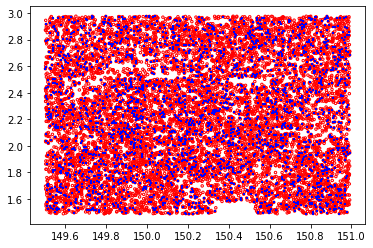

2720


In [15]:
merian_photocal = MerianPhotocal(merian_cat, blended_threshold=0.02)
plotter = StellarLocusPlotter()

## HSC Stellar Locus

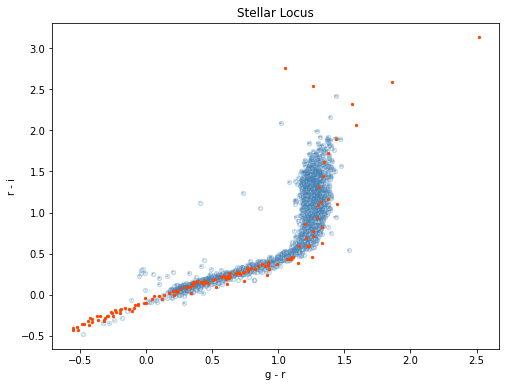

In [25]:
fig, ax = plotter.plot_stellar_locus('g r r i',merian_photocal)
plt.show()

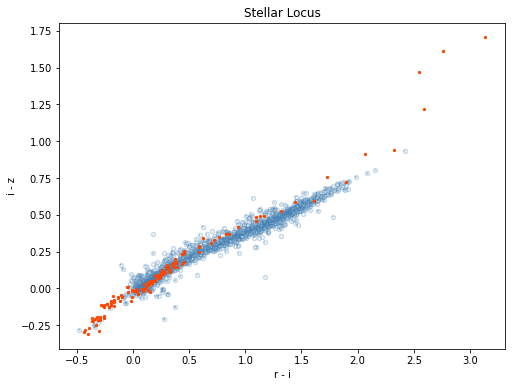

In [26]:
fig, ax = plotter.plot_stellar_locus('r i i z',merian_photocal)
plt.show()

## Merian-HSC Stellar Locus

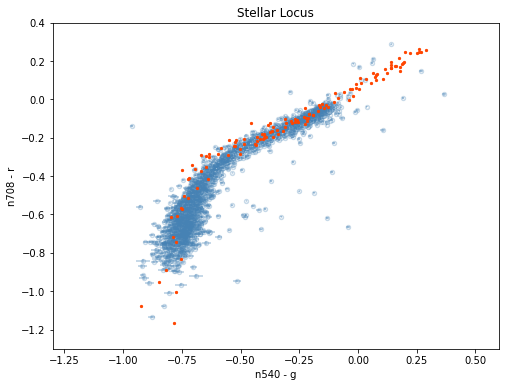

In [28]:
fig, ax = plotter.plot_stellar_locus('n540 g n708 r',merian_photocal)
plt.ylim(-1.3, 0.4)
plt.xlim(-1.3, 0.6)
plt.show()

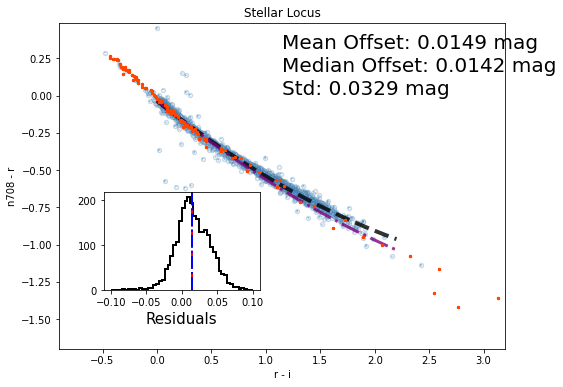

In [38]:
fig, ax = plotter.plot_stellar_locus('r i n708 r',merian_photocal)
fig, ax = plotter.fit_stellar_locus([0.0, 2.2, -1.5, 0.0],[0.1, 0.18, 0.35, 0.3])
ax.set_xlim(-0.9, 3.2)
ax.set_ylim(-1.7, 0.49)
plt.show()

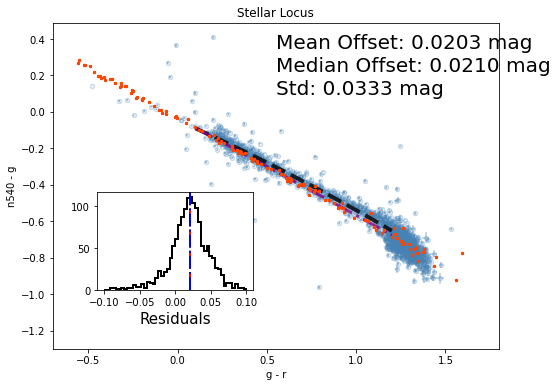

In [33]:
fig, ax = plotter.plot_stellar_locus('g r n540 g',merian_photocal)
fig, ax = plotter.fit_stellar_locus([0.1, 1.2, -0.9, -0.1],[0.1, 0.18, 0.35, 0.3])
ax.set_xlim(-0.7, 1.8)
ax.set_ylim(-1.3, 0.49)
plt.show()

(-1.0, 4.0)

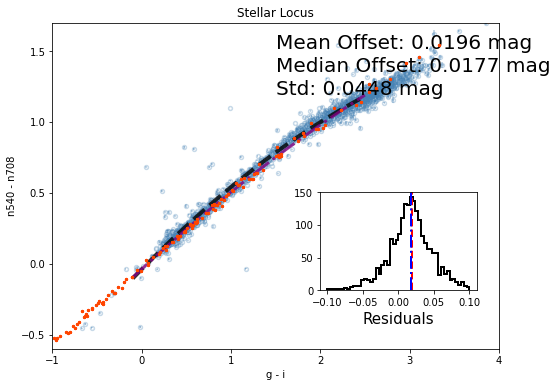

In [34]:
fig, ax = plotter.plot_stellar_locus('g i n540 n708',merian_photocal)
fig, ax = plotter.fit_stellar_locus([-0.1, 2.5, 0.0, 1.2],[0.6, 0.18, 0.35, 0.3])
ax.set_ylim(-0.6, 1.7)
ax.set_xlim(-1.0, 4.0)

# Apply Extra Flag?

## HSC color selection

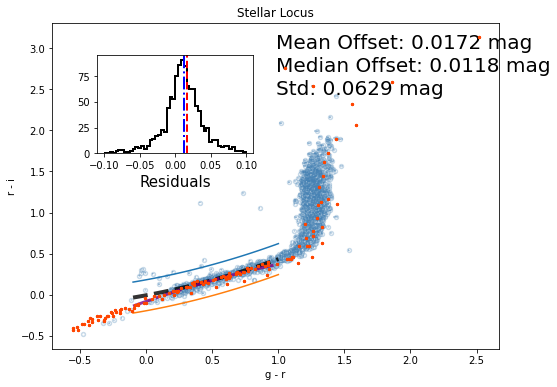

In [55]:
fig, ax = plotter.plot_stellar_locus('g r r i',merian_photocal)
fig, ax, poly, std = plotter.fit_stellar_locus([-.1, 1, -1, 2],[0.1, 0.6, 0.35, 0.3],return_poly=True)
ax.plot(np.linspace(-.1,1,100),np.poly1d(poly)(np.linspace(-.1,1,100))+3*std)
ax.plot(np.linspace(-.1,1,100),np.poly1d(poly)(np.linspace(-.1,1,100))-3*std)
plt.show()

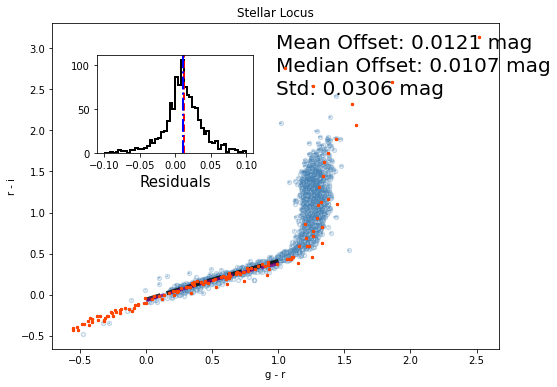

In [58]:
x,x_err=merian_photocal.cal_color('g','r')
y_max=np.poly1d(poly)(x)+3*std
y_min=np.poly1d(poly)(x)-3*std
y,y_err=merian_photocal.cal_color('r','i')

color_range=[-.25, 1, -1, 2]
hsc_gri_flag=((color_range[0]<x)&(x<color_range[1])&(y>y_min)&(y<y_max))|\
             (color_range[0]>x)|(x>color_range[1])

merian_photocal.apply_extra_flag(hsc_gri_flag)
fig, ax = plotter.plot_stellar_locus('g r r i',merian_photocal)
fig, ax,= plotter.fit_stellar_locus([0, 1, -1, 2],[0.1, 0.6, 0.35, 0.3])
plt.show()

Applied extra flag


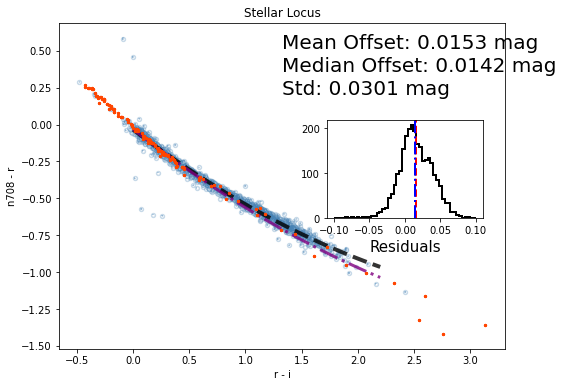

Not applied


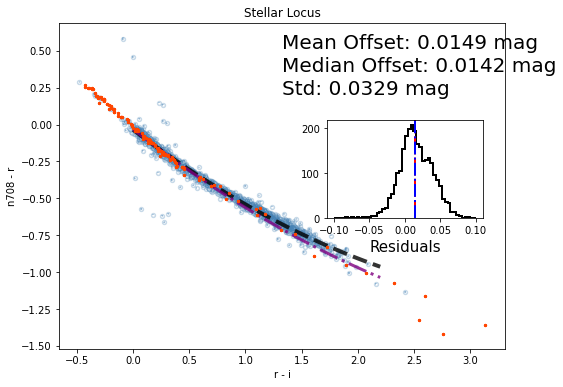

In [61]:
print('Applied extra flag')
merian_photocal.apply_extra_flag(hsc_gri_flag)
fig, ax = plotter.plot_stellar_locus('r i n708 r',merian_photocal)
fig, ax = plotter.fit_stellar_locus([0.0, 2.2, -1.5, 0.0],[0.6, 0.4, 0.35, 0.3])
plt.show()
print('Not applied')
merian_photocal.remove_extra_flag()
fig, ax = plotter.plot_stellar_locus('r i n708 r',merian_photocal)
fig, ax = plotter.fit_stellar_locus([0.0, 2.2, -1.5, 0.0],[0.6, 0.4, 0.35, 0.3])
plt.show()

## Extra Merian flag

In [44]:
extra_merian_flag = ~merian_photocal.star_catalog_use['N708_pixelFlags_cr_Merian']&\
                    ~merian_photocal.star_catalog_use['N540_pixelFlags_cr_Merian']

Applied extra flag


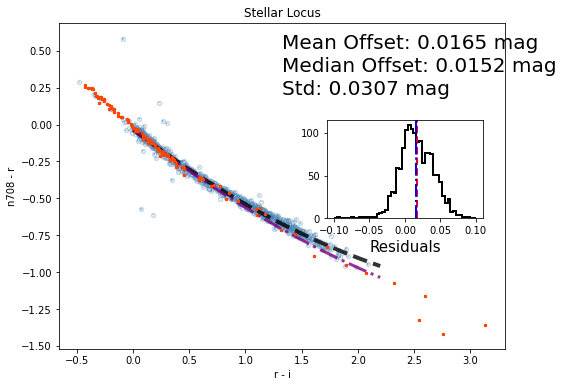

Not applied


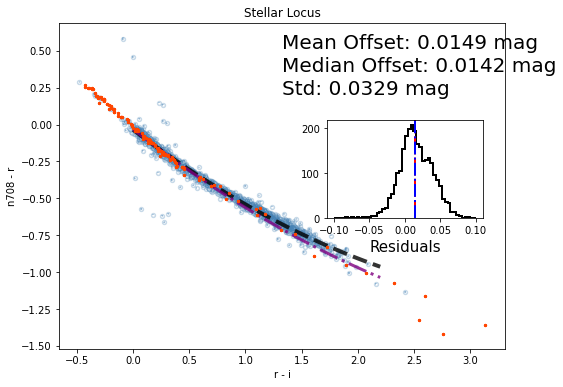

In [45]:
print('Applied extra flag')
merian_photocal.apply_extra_flag(extra_merian_flag)
fig, ax = plotter.plot_stellar_locus('r i n708 r',merian_photocal)
fig, ax = plotter.fit_stellar_locus([0.0, 2.2, -1.5, 0.0],[0.6, 0.4, 0.35, 0.3])
plt.show()
print('Not applied')
merian_photocal.remove_extra_flag()
fig, ax = plotter.plot_stellar_locus('r i n708 r',merian_photocal)
fig, ax = plotter.fit_stellar_locus([0.0, 2.2, -1.5, 0.0],[0.6, 0.4, 0.35, 0.3])
plt.show()

# Test on `blended_threshold`

## r-i v.s. n708-r

12380
2777


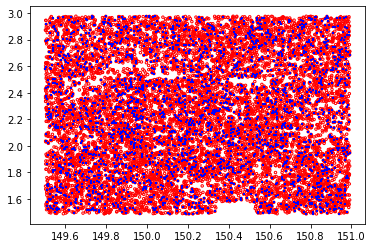

2777


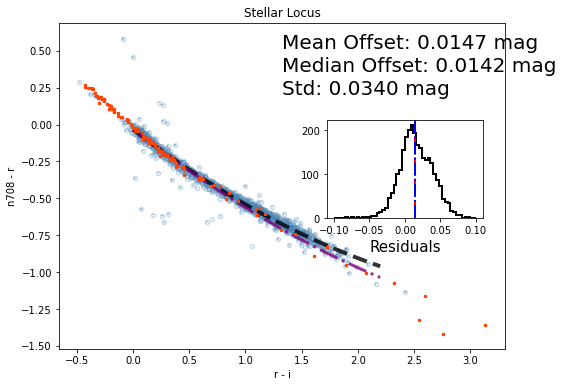

12366
2777


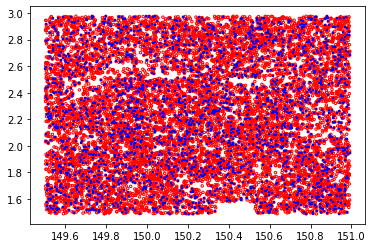

2777


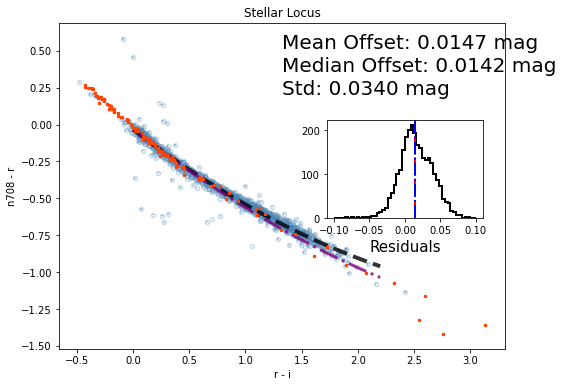

12353
2777


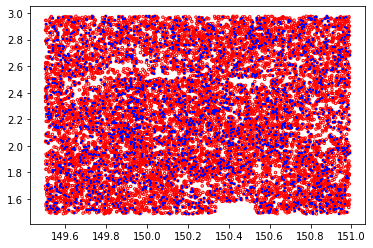

2777


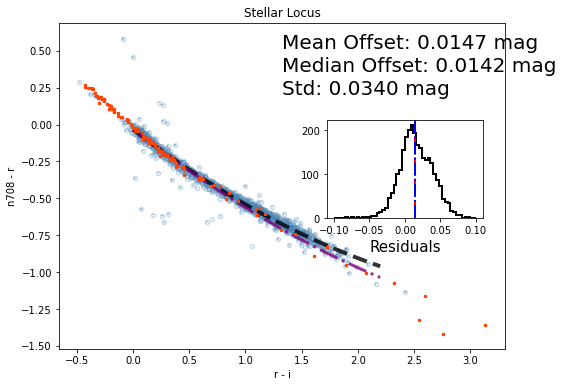

12336
2777


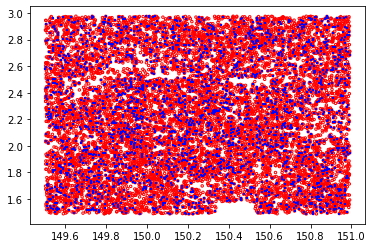

2777


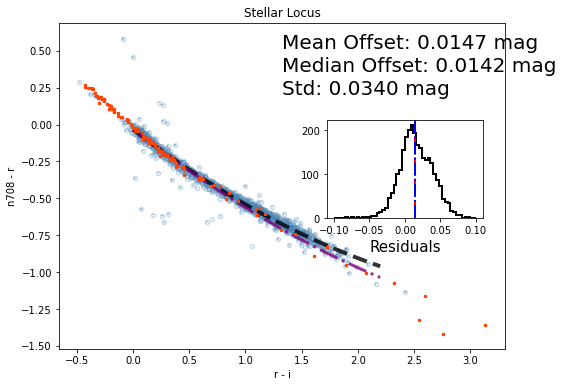

12319
2776


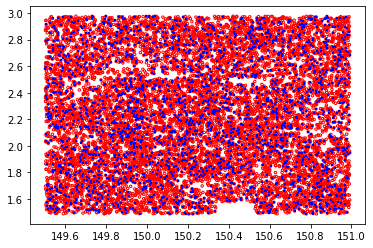

2776


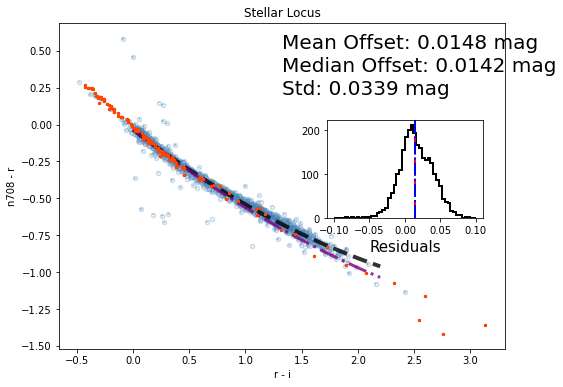

12294
2775


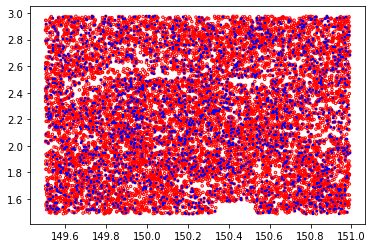

2775


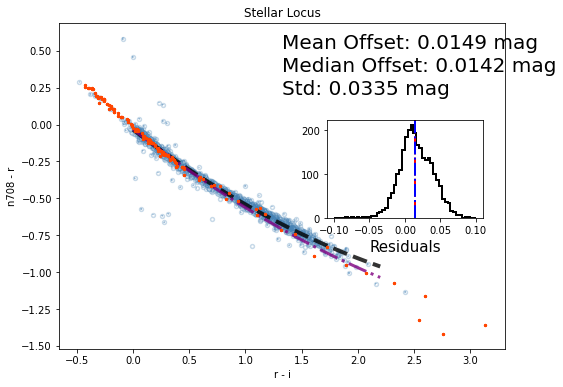

12247
2774


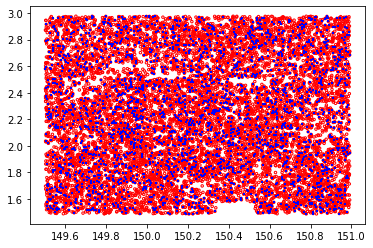

2774


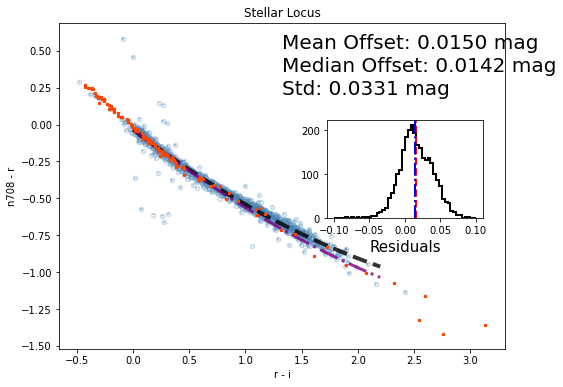

12176
2770


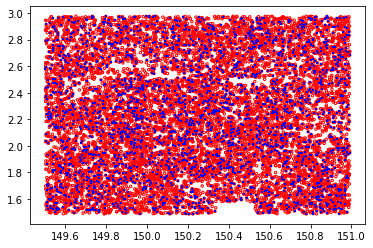

2770


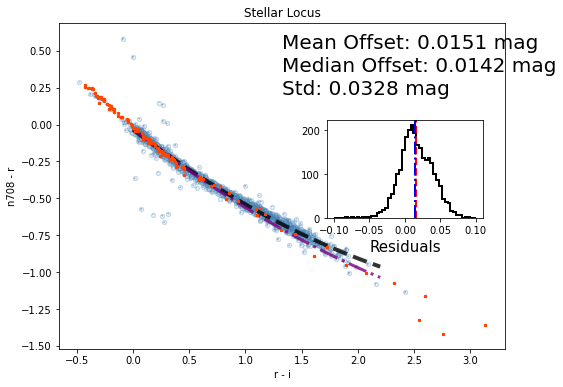

11985
2767


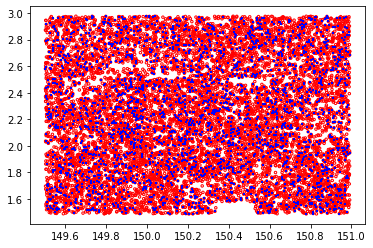

2767


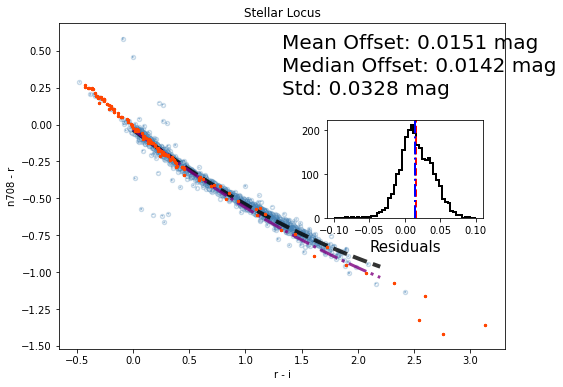

11960
2765


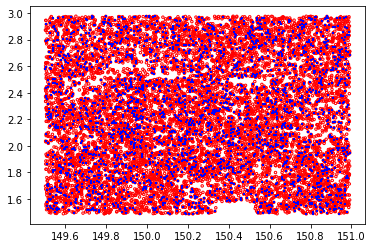

2765


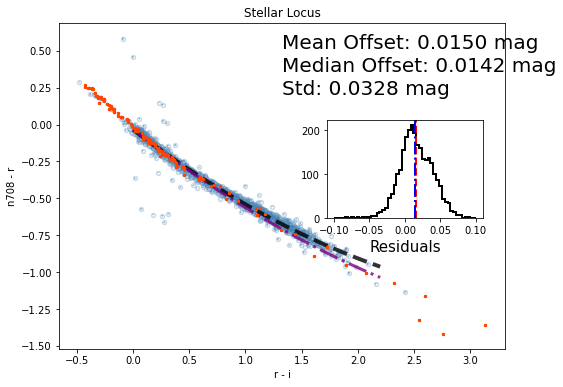

11916
2760


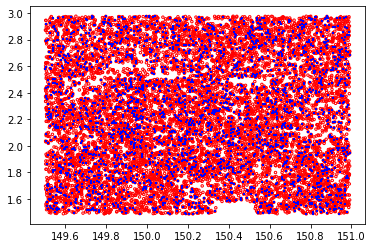

2760


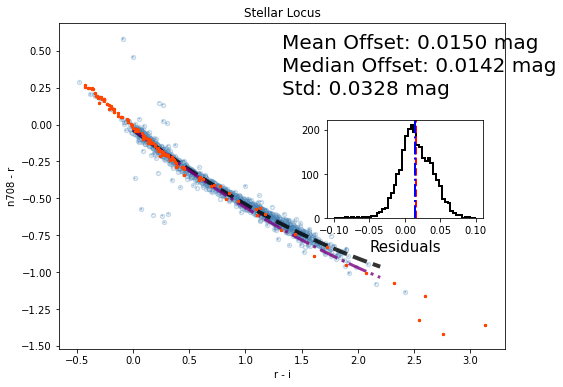

11873
2758


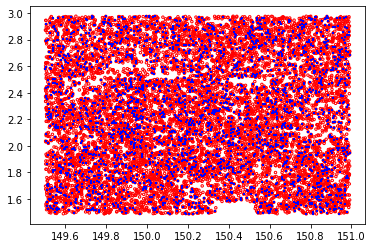

2758


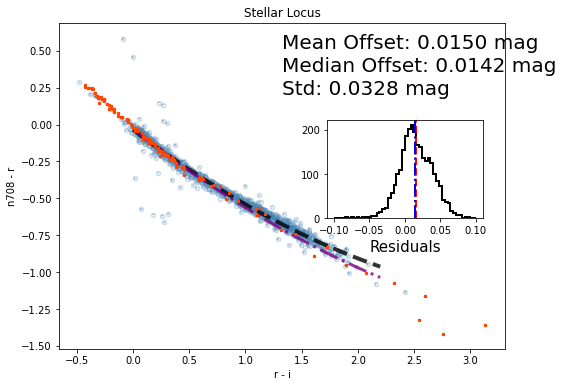

11828
2758


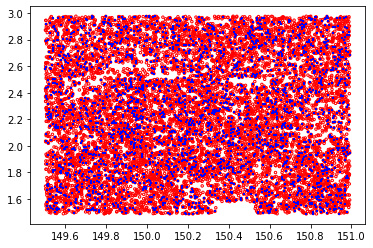

2758


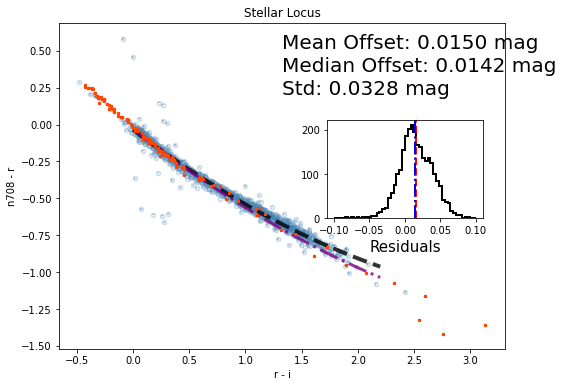

11752
2754


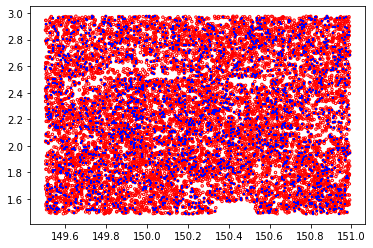

2754


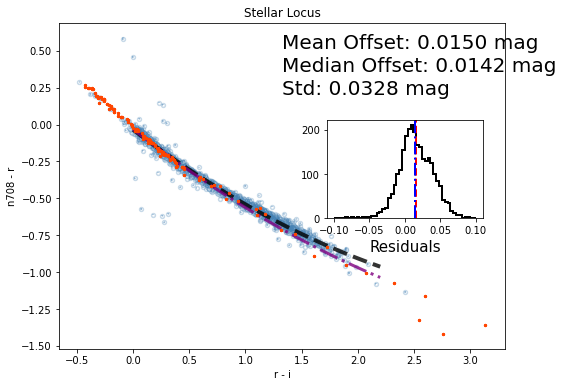

11677
2747


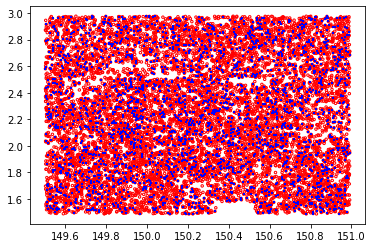

2747


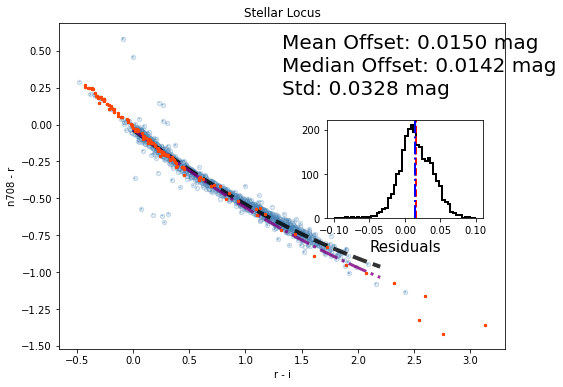

11571
2740


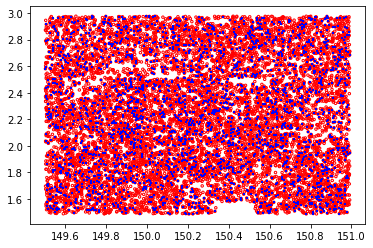

2740


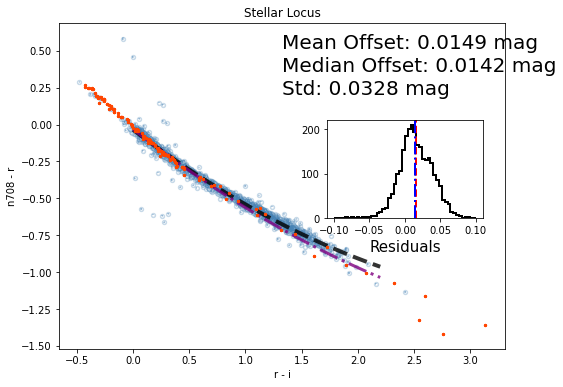

11410
2720


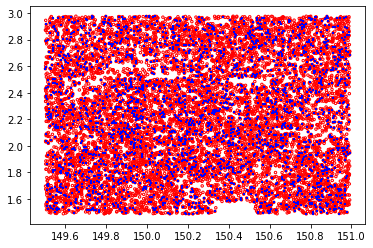

2720


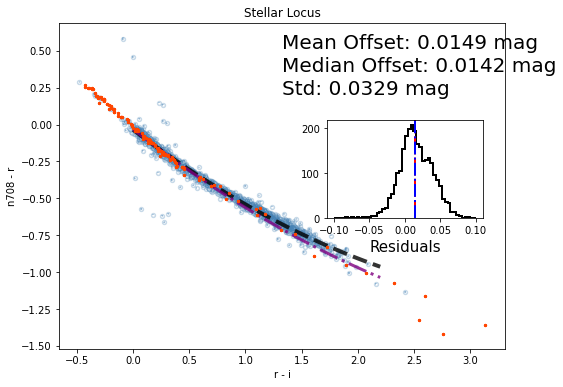

11072
2679


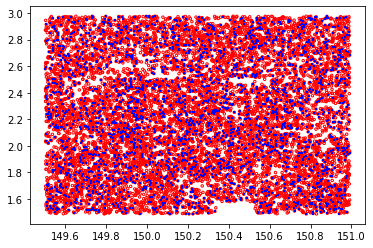

2679


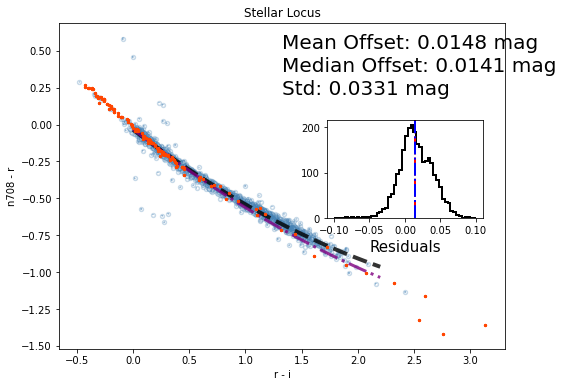

11016
2673


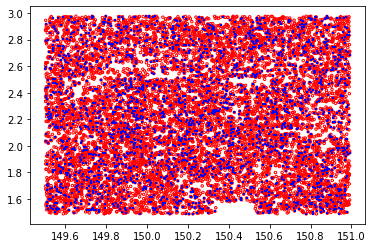

2673


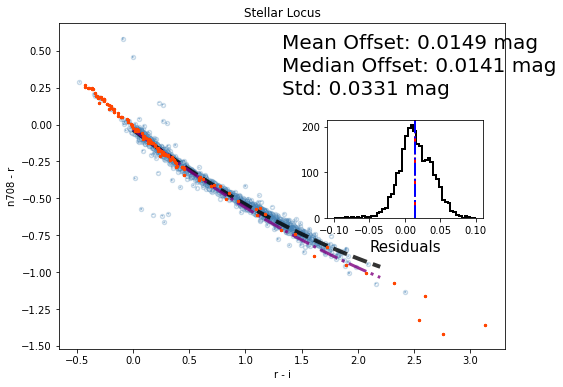

10945
2662


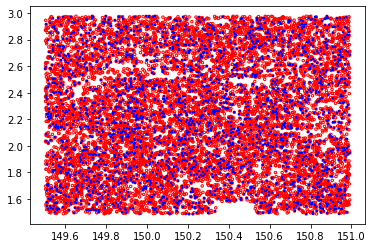

2662


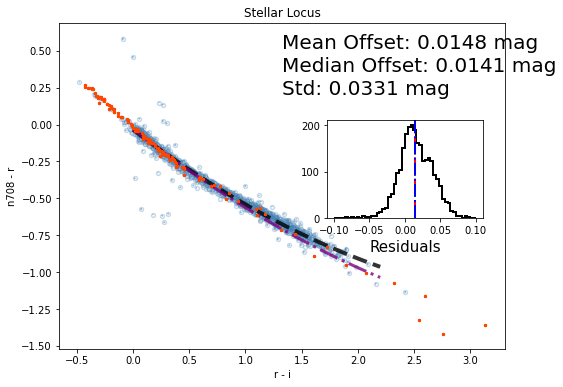

10868
2654


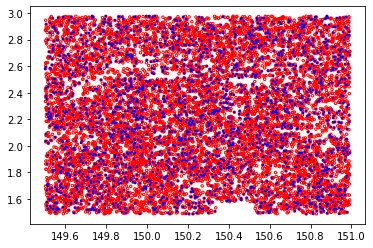

2654


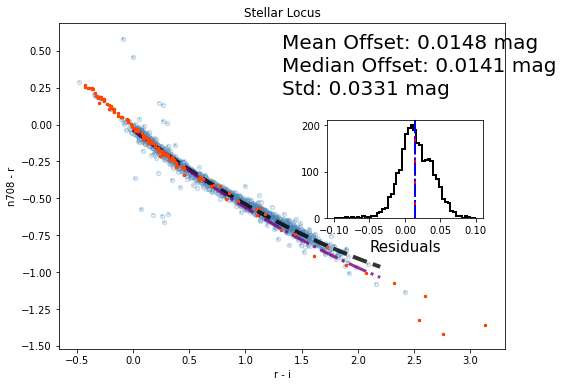

10799
2645


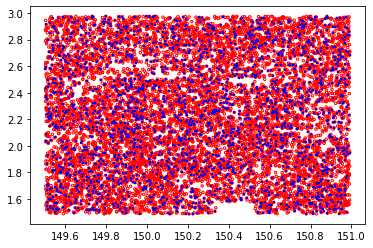

2645


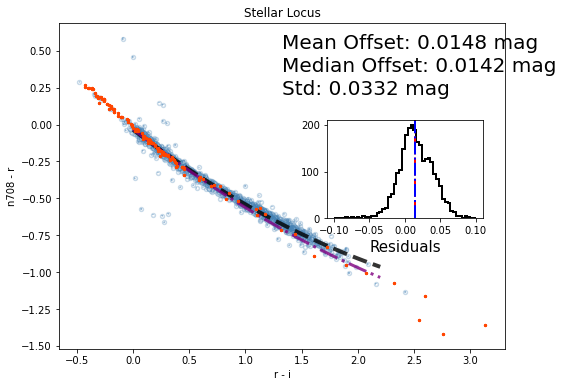

10702
2633


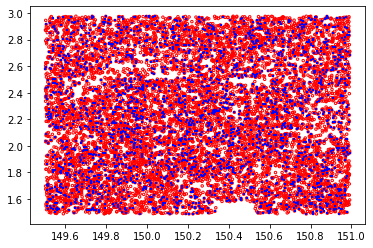

2633


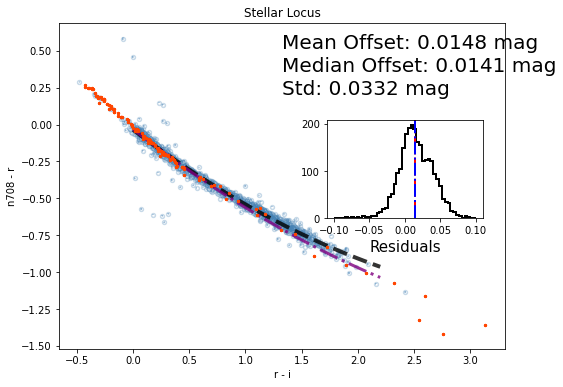

10546
2603


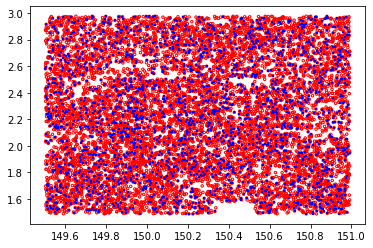

2603


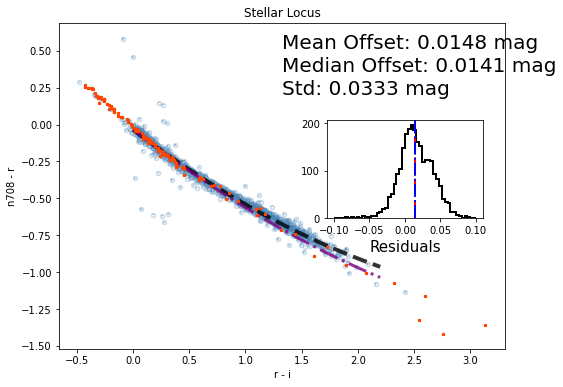

10324
2563


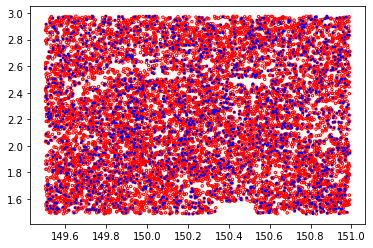

2563


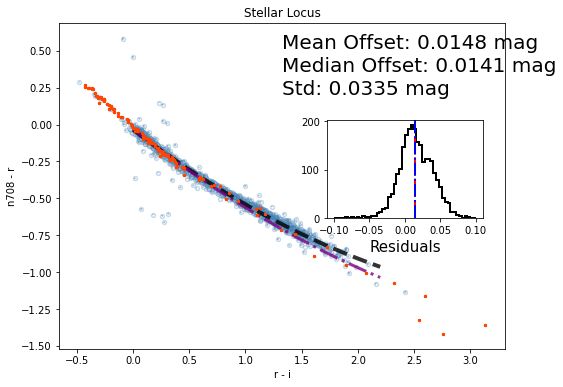

10020
2524


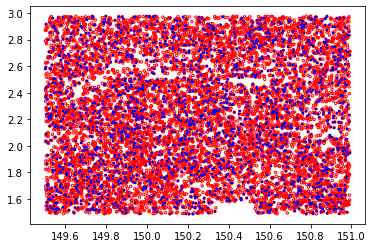

2524


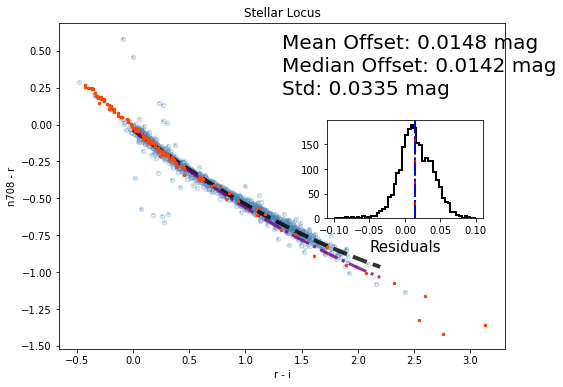

9428
2456


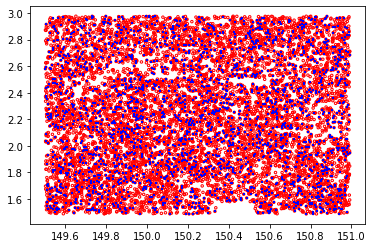

2456


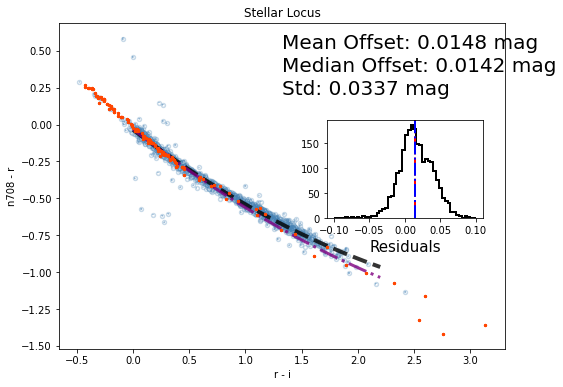

9317
2440


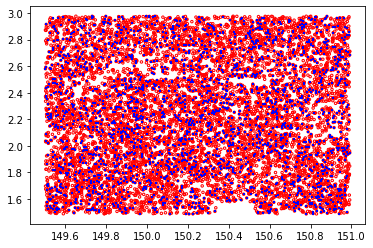

2440


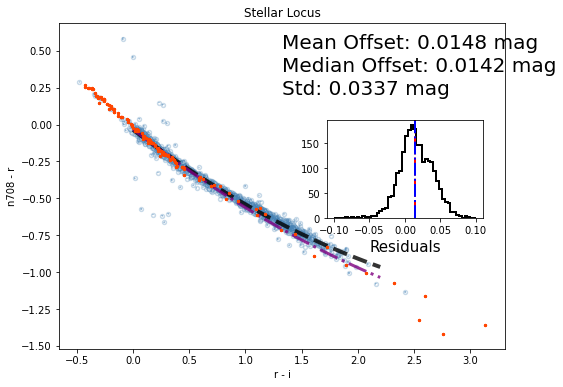

9223
2432


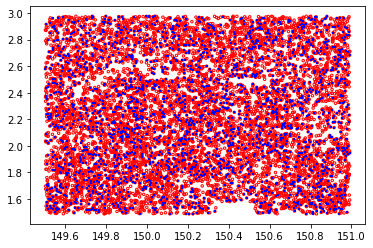

2432


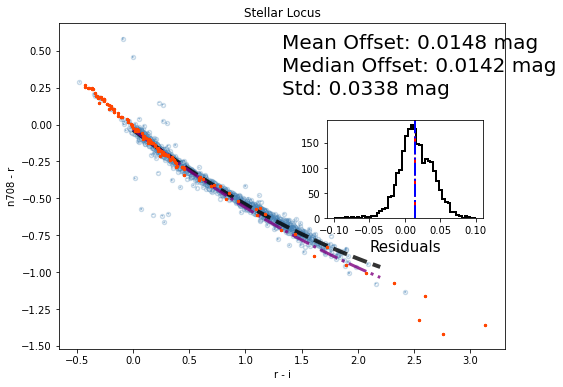

9085
2410


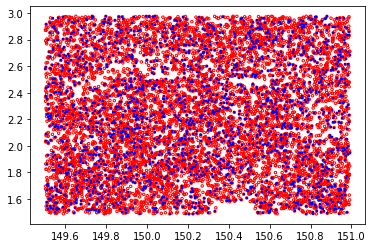

2410


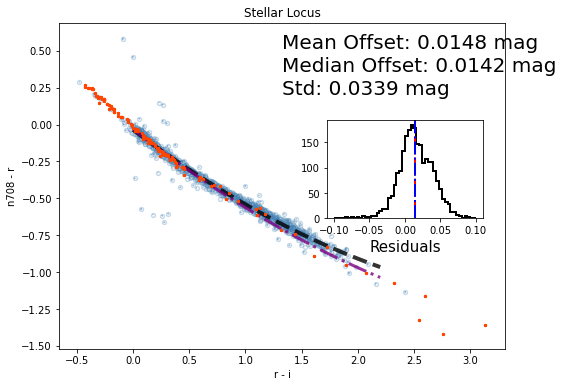

8952
2394


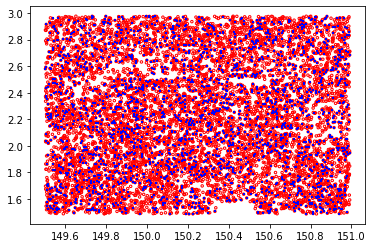

2394


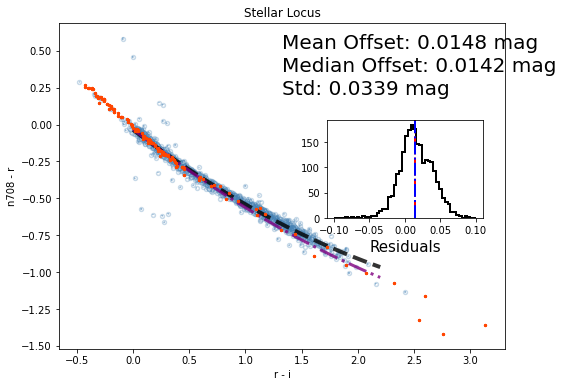

8740
2375


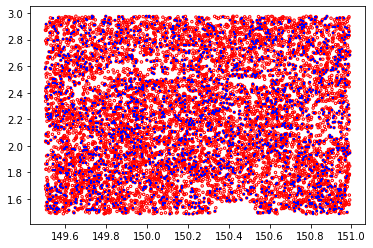

2375


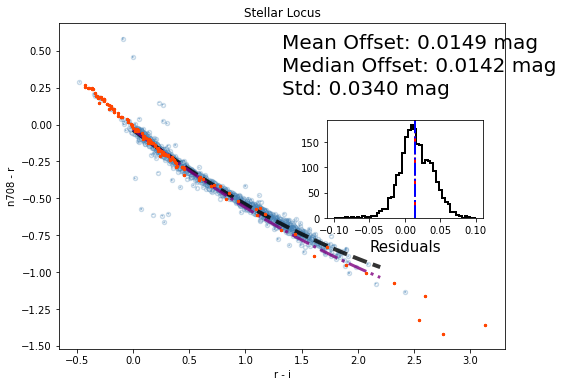

8501
2344


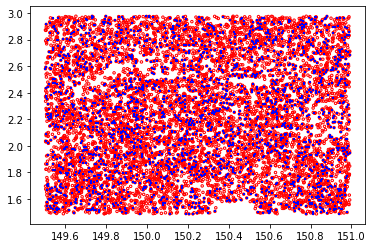

2344


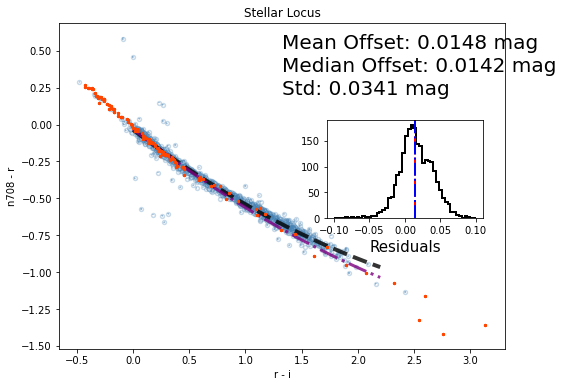

8169
2304


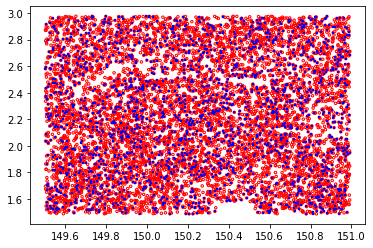

2304


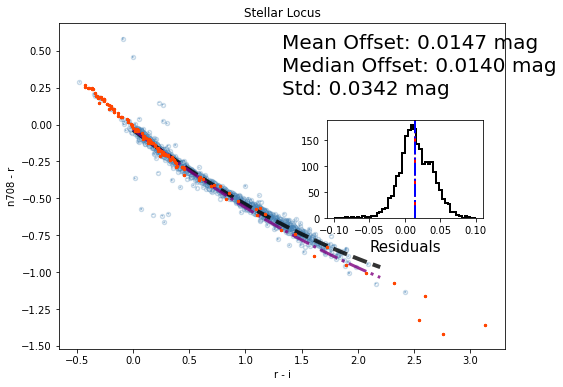

7779
2258


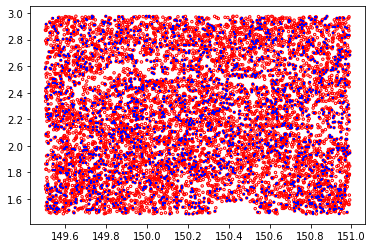

2258


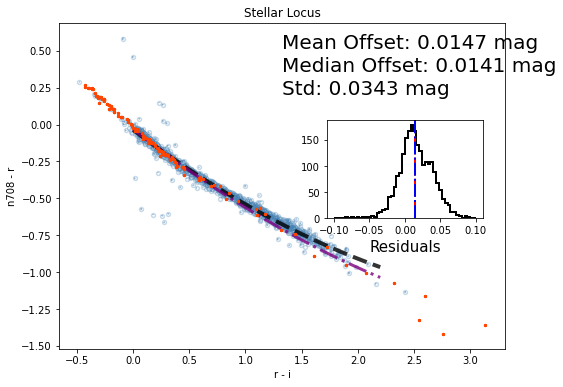

7111
2160


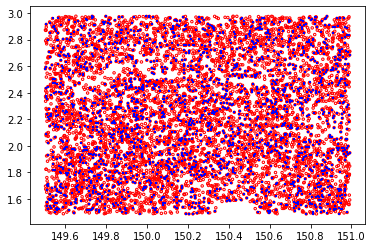

2160


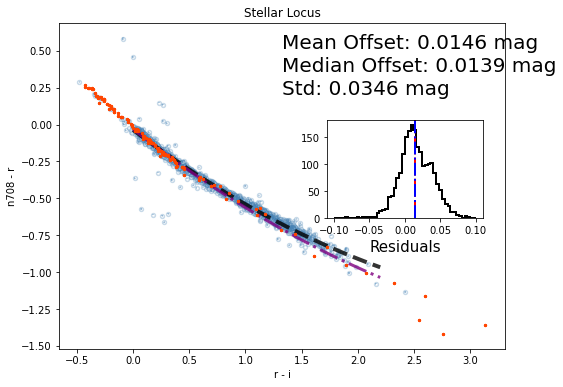

In [79]:
thresholds=np.concatenate([.1**i*np.arange(9,0,-1) for i in range(1,5)],axis=0)
evaluation=[[],[],[]]
n=[]
for i in range(len(thresholds)):
    t=thresholds[i]
    merian_photocal.blended_cut(t)
    n.append(len(merian_photocal.star_catalog_use))
    fig, ax = plotter.plot_stellar_locus('r i n708 r',merian_photocal)
    fig, ax,mean,median,std = plotter.fit_stellar_locus([0.0, 2.2, -1.5, 0.0],[0.6, 0.4, 0.35, 0.3],return_evaluation=True)
    plt.show()
    evaluation[0].append(mean)
    evaluation[1].append(median)
    evaluation[2].append(std)

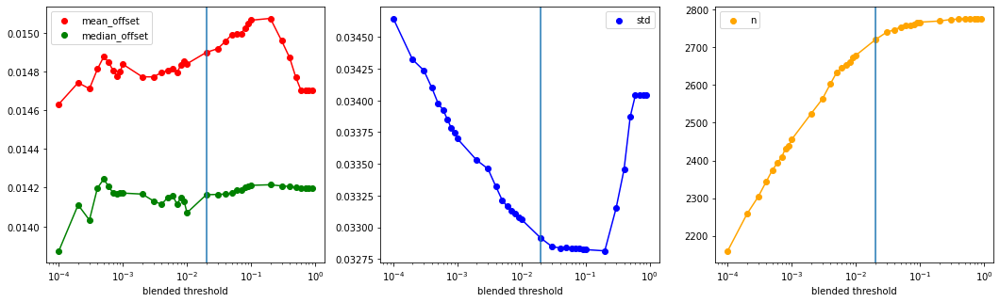

In [80]:
plt.figure(figsize=(18,5))
plt.subplot(131)
plt.scatter(thresholds,evaluation[0],c='r',label='mean_offset')
plt.plot(thresholds,evaluation[0],c='r')
plt.scatter(thresholds,evaluation[1],c='g',label='median_offset')
plt.plot(thresholds,evaluation[1],c='g')
plt.axvline(0.02)
plt.legend()
plt.xlabel('blended threshold')
plt.xscale('log')

plt.subplot(132)
plt.scatter(thresholds,evaluation[2],c='b',label='std')
plt.plot(thresholds,evaluation[2],c='b')
plt.axvline(0.02)
plt.legend()
plt.xlabel('blended threshold')
plt.xscale('log')

plt.subplot(133)
plt.scatter(thresholds,n,c='orange',label='n')
plt.plot(thresholds,n,c='orange')
plt.axvline(0.02)
plt.legend()
plt.xlabel('blended threshold')
plt.xscale('log')
plt.show()

## g-r v.s. n540-g

12380
2777


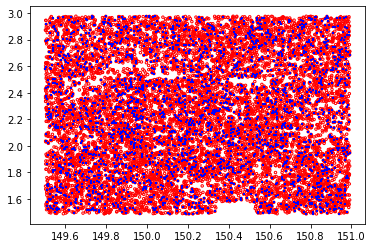

2777


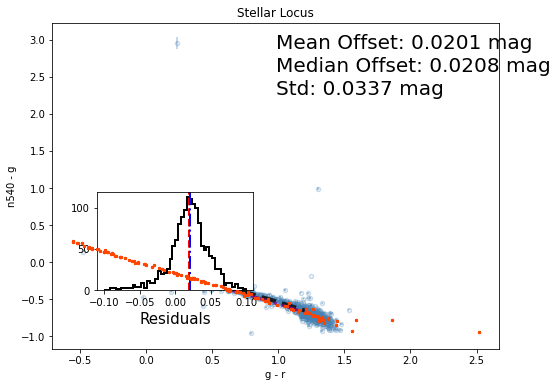

12366
2777


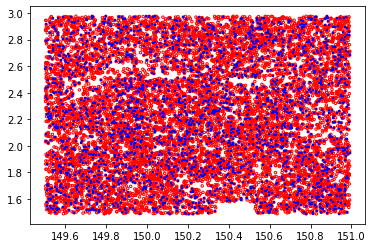

2777


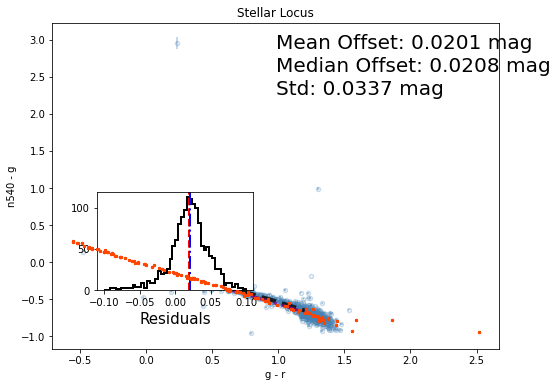

12353
2777


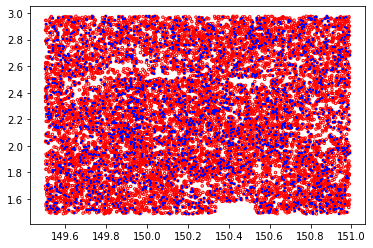

2777


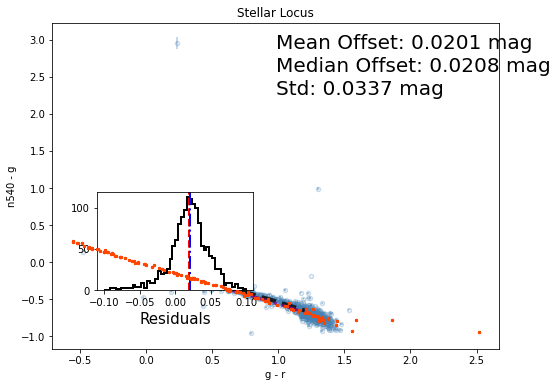

12336
2777


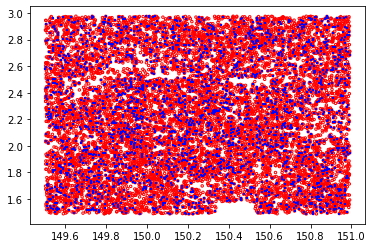

2777


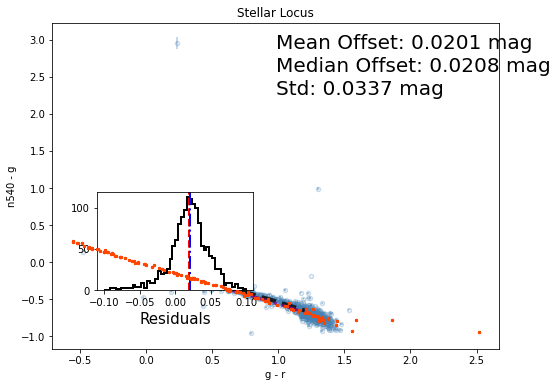

12319
2776


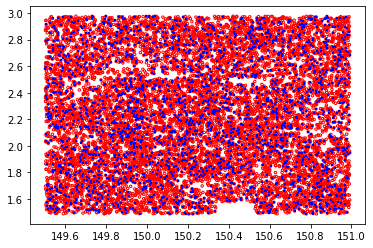

2776


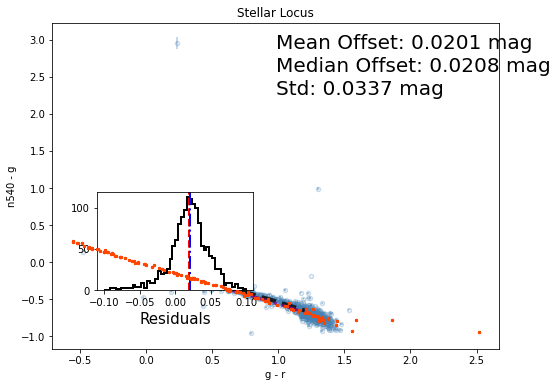

12294
2775


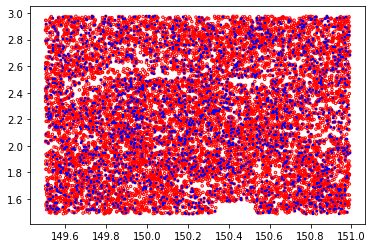

2775


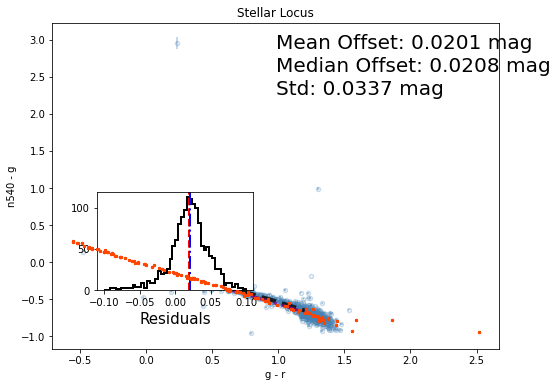

12247
2774


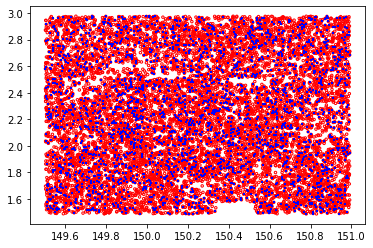

2774


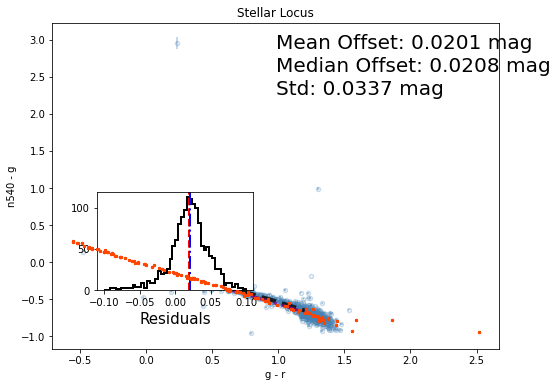

12176
2770


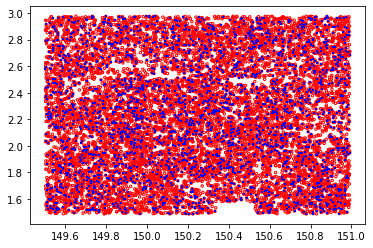

2770


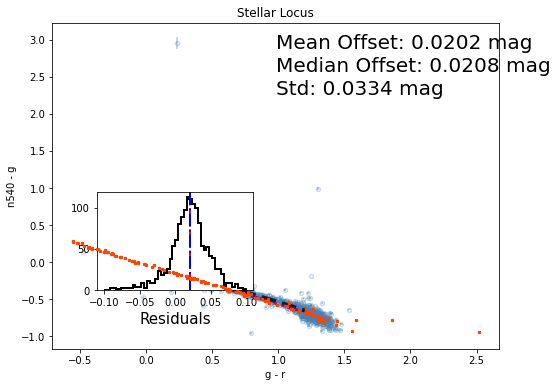

11985
2767


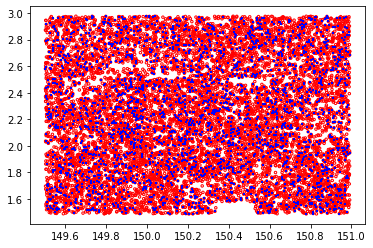

2767


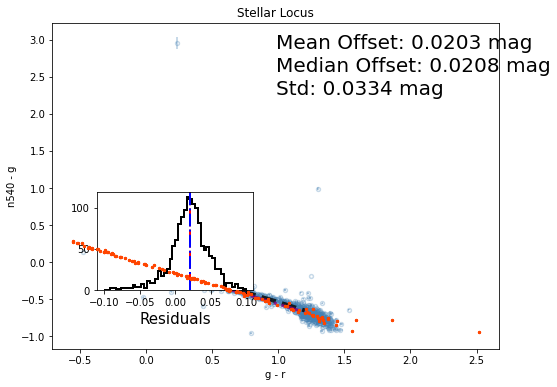

11960
2765


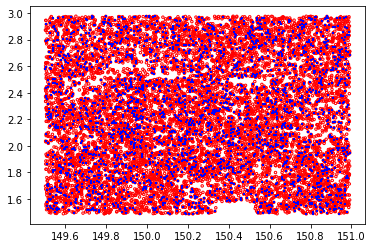

2765


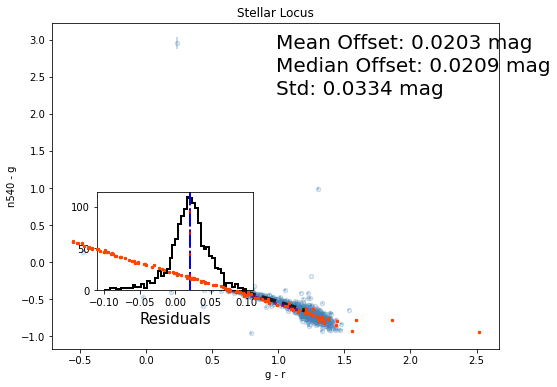

11916
2760


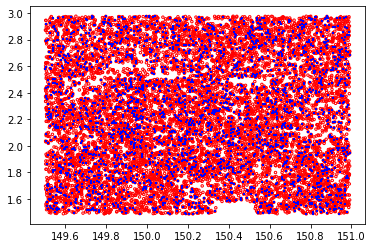

2760


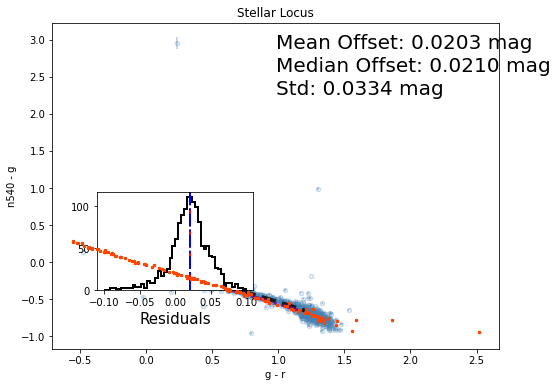

11873
2758


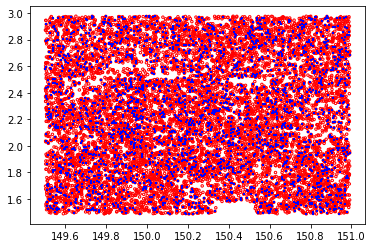

2758


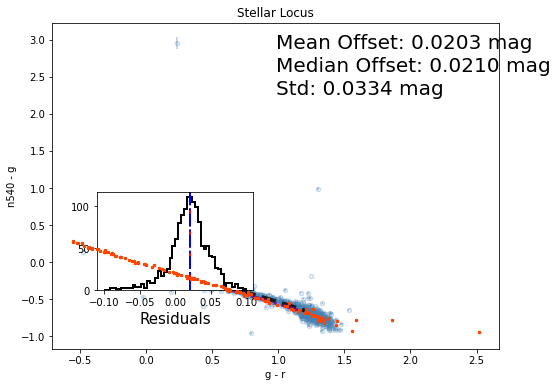

11828
2758


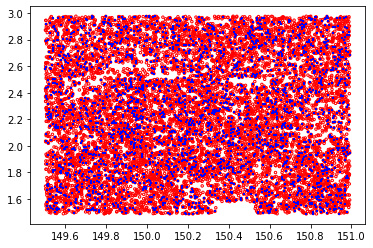

2758


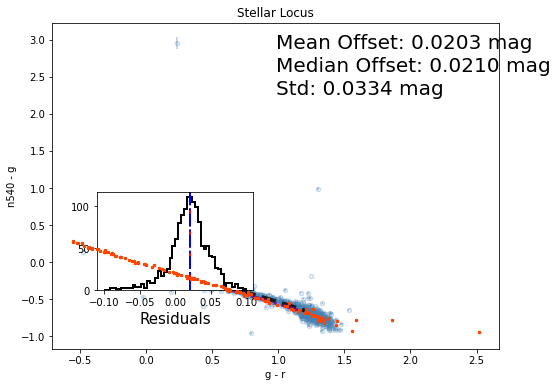

11752
2754


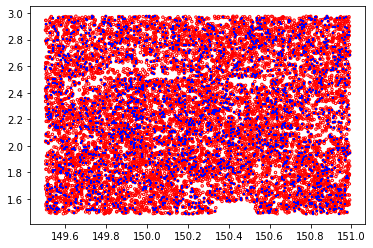

2754


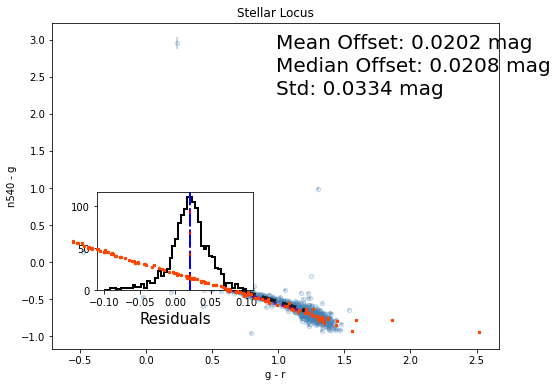

11677
2747


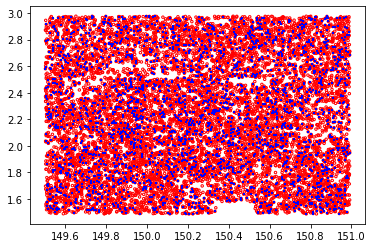

2747


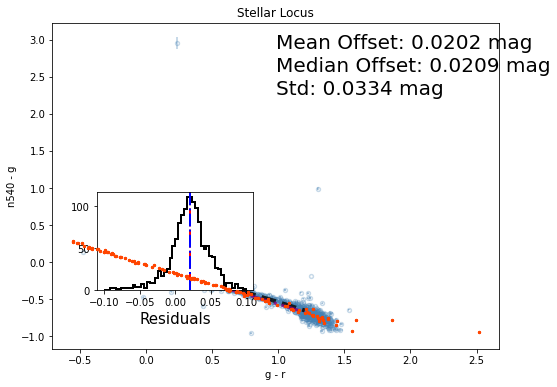

11571
2740


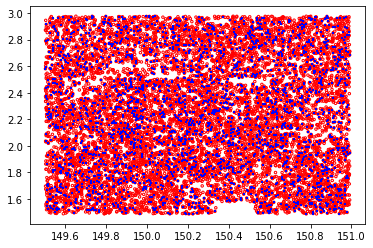

2740


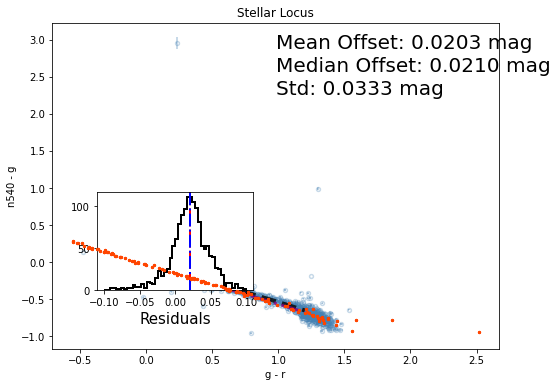

11410
2720


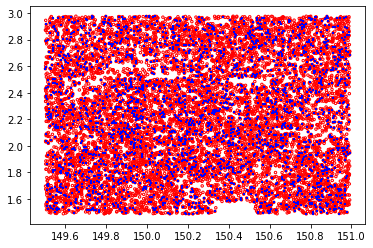

2720


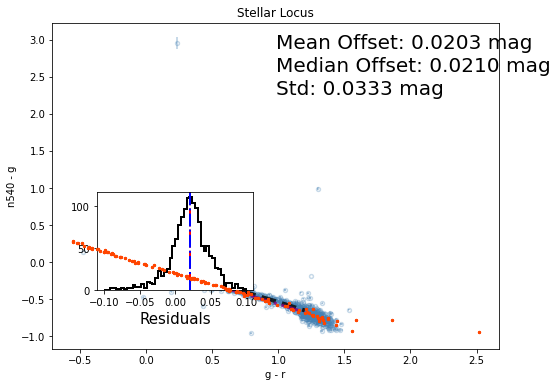

11072
2679


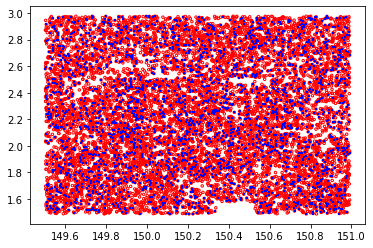

2679


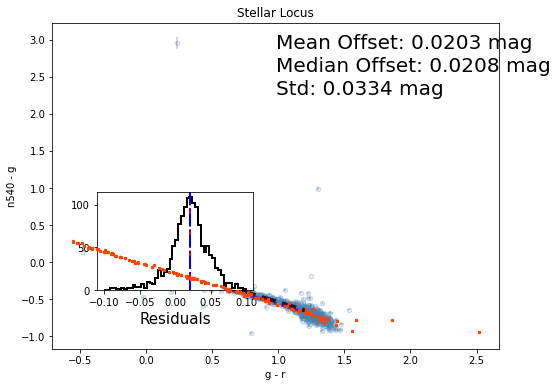

11016
2673


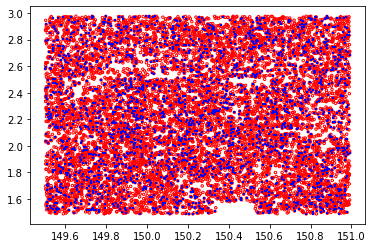

2673


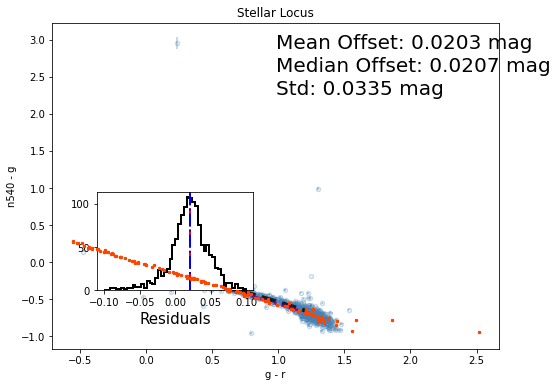

10945
2662


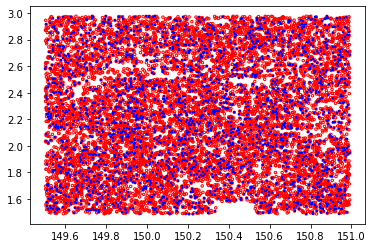

2662


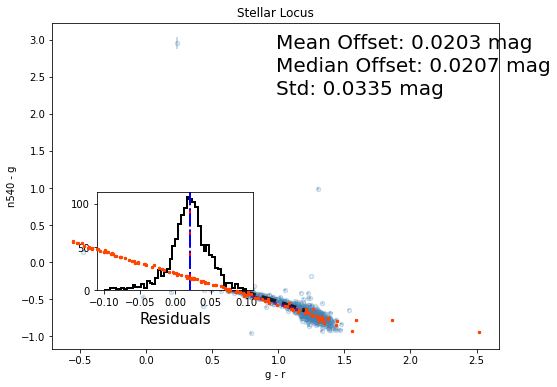

10868
2654


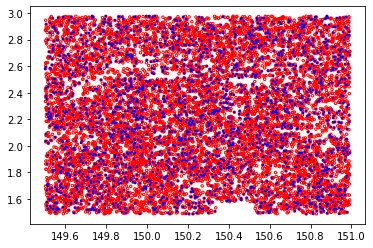

2654


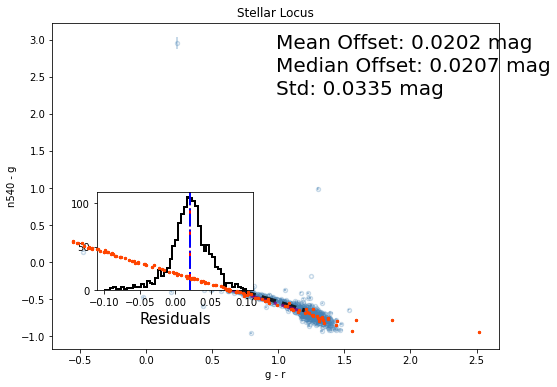

10799
2645


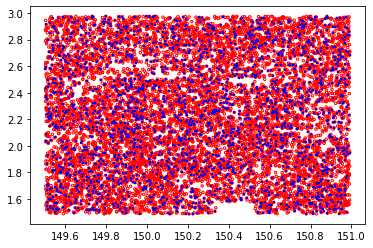

2645


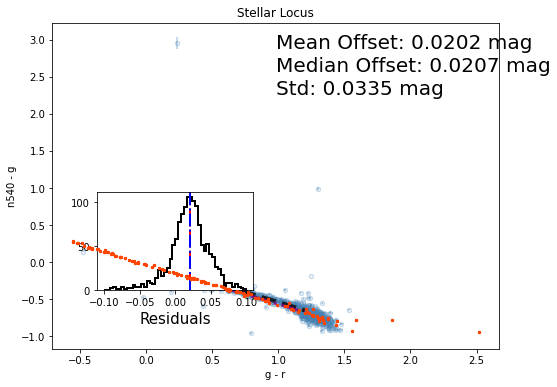

10702
2633


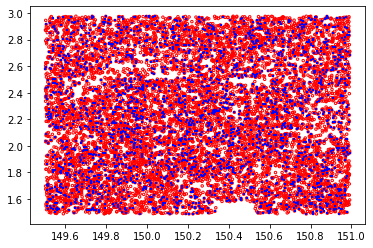

2633


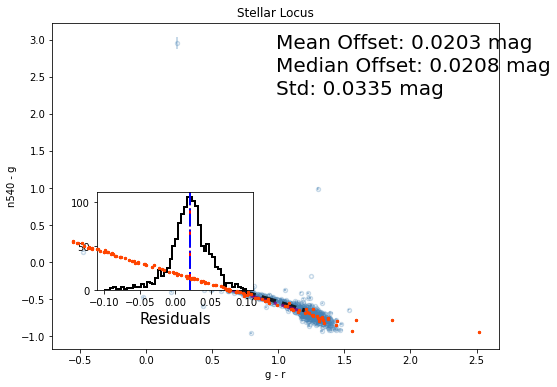

10546
2603


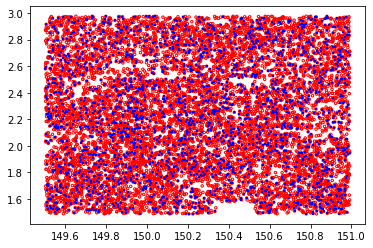

2603


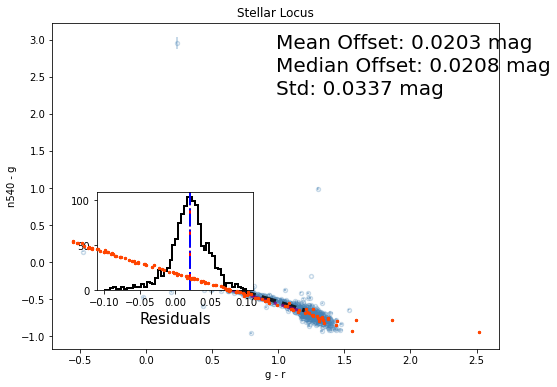

10324
2563


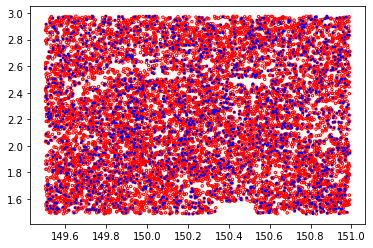

2563


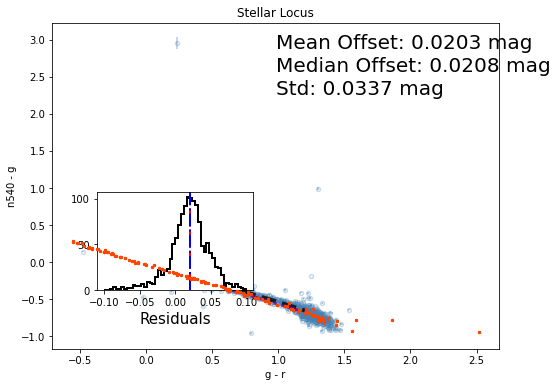

10020
2524


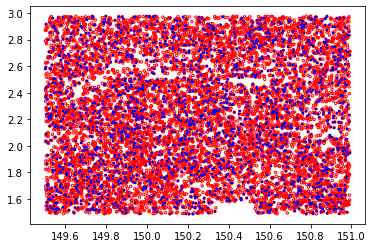

2524


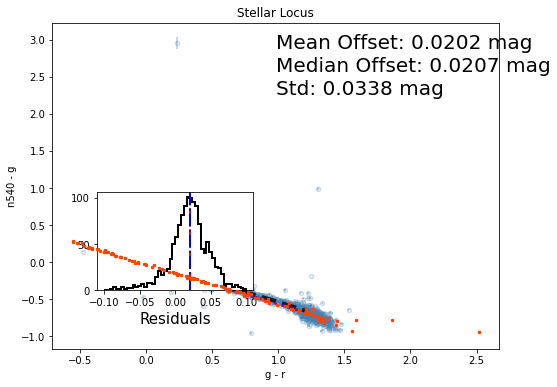

9428
2456


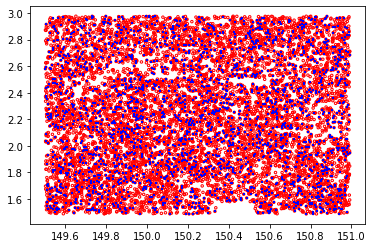

2456


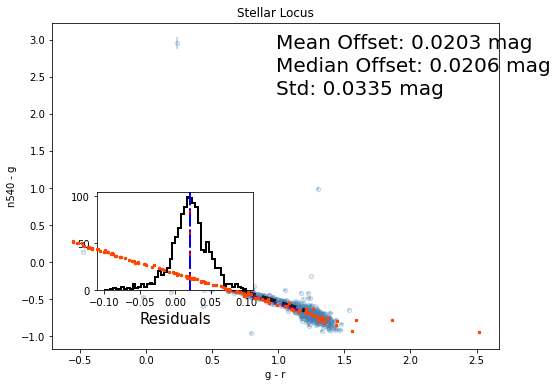

9317
2440


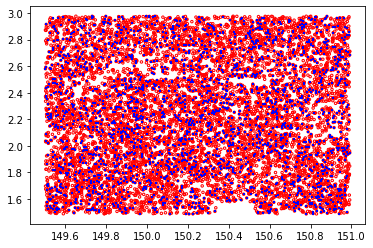

2440


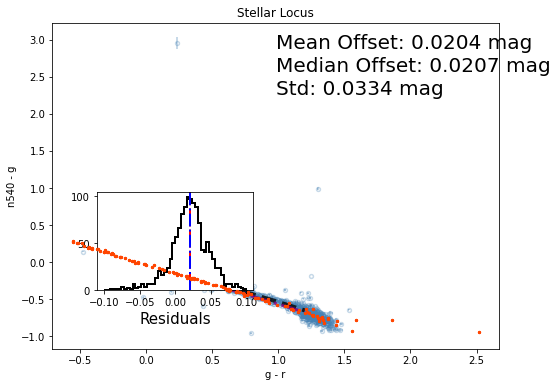

9223
2432


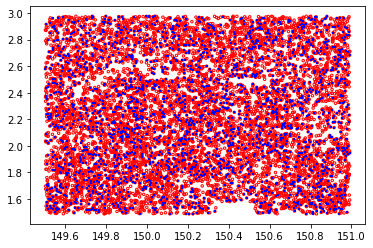

2432


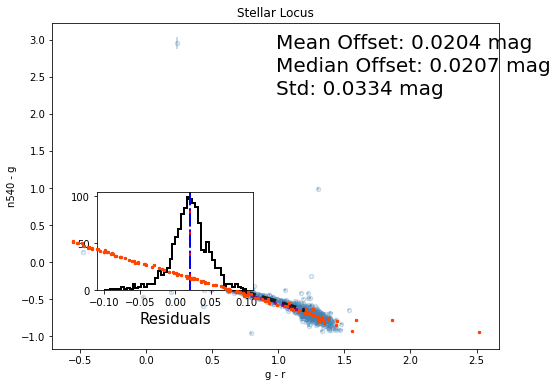

9085
2410


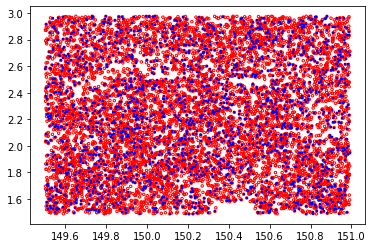

2410


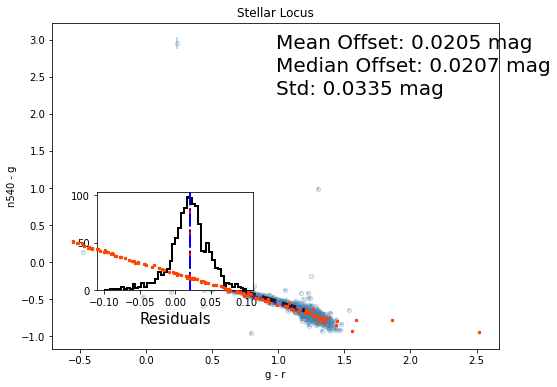

8952
2394


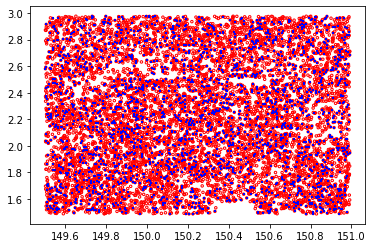

2394


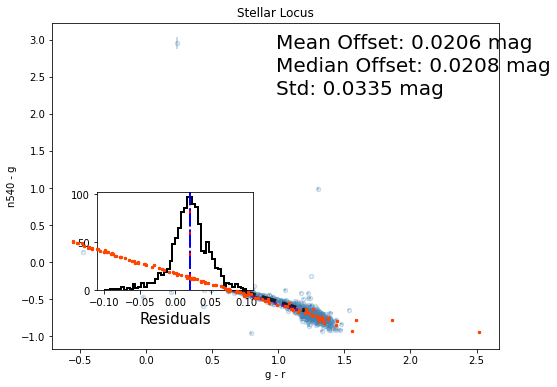

8740
2375


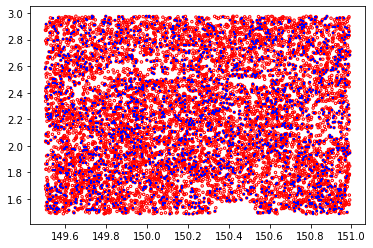

2375


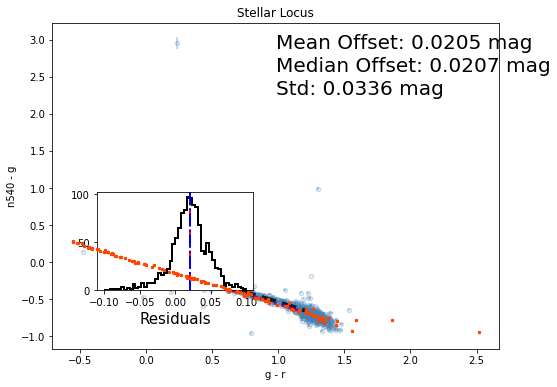

8501
2344


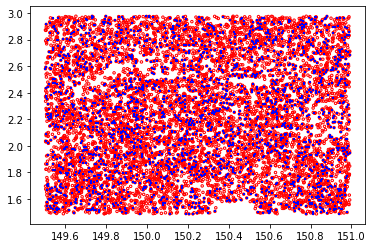

2344


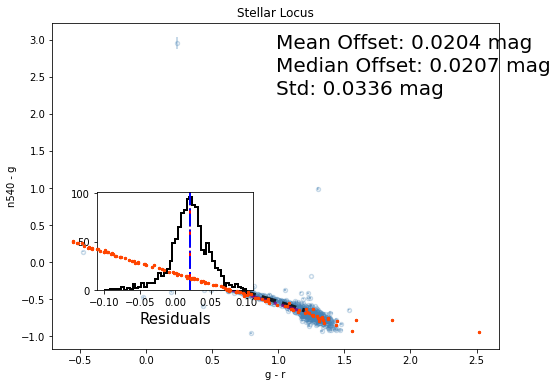

8169
2304


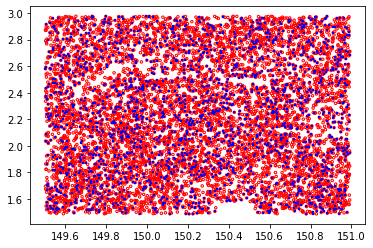

2304


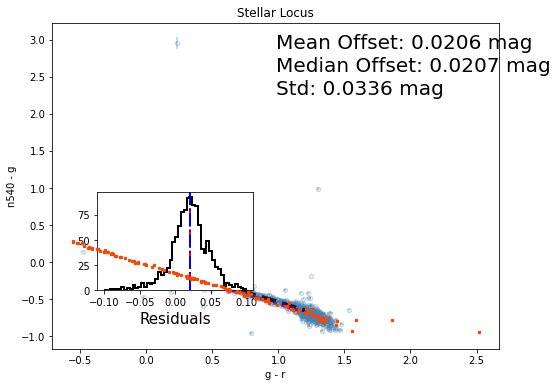

7779
2258


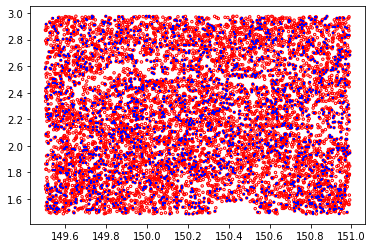

2258


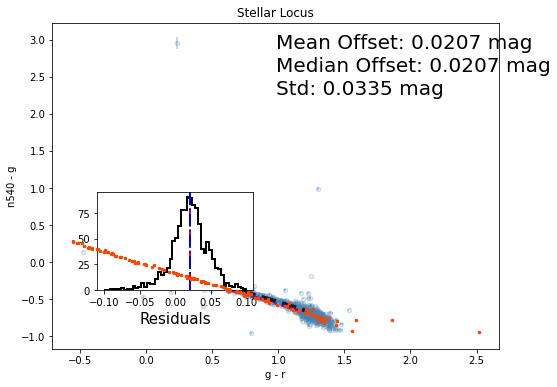

7111
2160


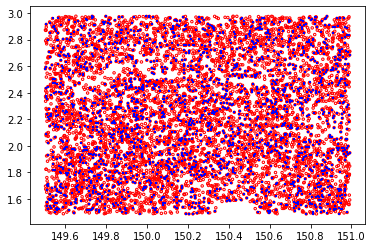

2160


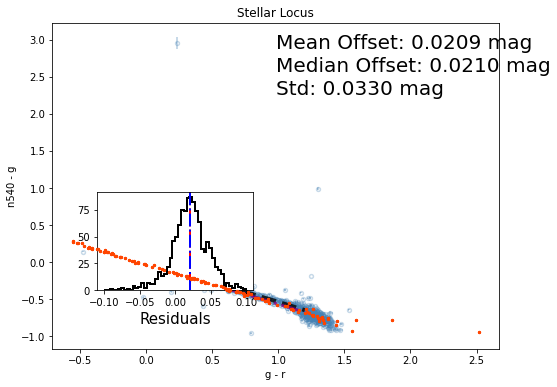

In [83]:
thresholds=np.concatenate([.1**i*np.arange(9,0,-1) for i in range(1,5)],axis=0)
evaluation=[[],[],[]]
n=[]
for i in range(len(thresholds)):
    t=thresholds[i]
    merian_photocal.blended_cut(t)
    n.append(len(merian_photocal.star_catalog_use))
    fig, ax = plotter.plot_stellar_locus('g r n540 g',merian_photocal)
    fig, ax,mean,median,std = plotter.fit_stellar_locus([0.1, 1.2, -0.9, -0.1],[0.1, 0.18, 0.35, 0.3],return_evaluation=True)
    plt.show()
    evaluation[0].append(mean)
    evaluation[1].append(median)
    evaluation[2].append(std)

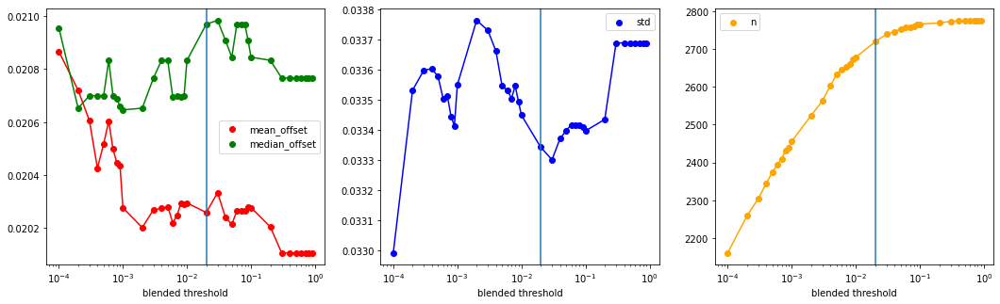

In [84]:
plt.figure(figsize=(18,5))
plt.subplot(131)
plt.scatter(thresholds,evaluation[0],c='r',label='mean_offset')
plt.plot(thresholds,evaluation[0],c='r')
plt.scatter(thresholds,evaluation[1],c='g',label='median_offset')
plt.plot(thresholds,evaluation[1],c='g')
plt.axvline(0.02)
plt.legend()
plt.xlabel('blended threshold')
plt.xscale('log')

plt.subplot(132)
plt.scatter(thresholds,evaluation[2],c='b',label='std')
plt.plot(thresholds,evaluation[2],c='b')
plt.axvline(0.02)
plt.legend()
plt.xlabel('blended threshold')
plt.xscale('log')

plt.subplot(133)
plt.scatter(thresholds,n,c='orange',label='n')
plt.plot(thresholds,n,c='orange')
plt.axvline(0.02)
plt.legend()
plt.xlabel('blended threshold')
plt.xscale('log')
plt.show()

## g-i v.s. n540-n708

12380
2777


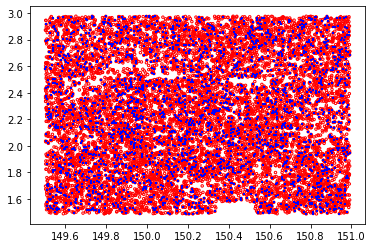

2777


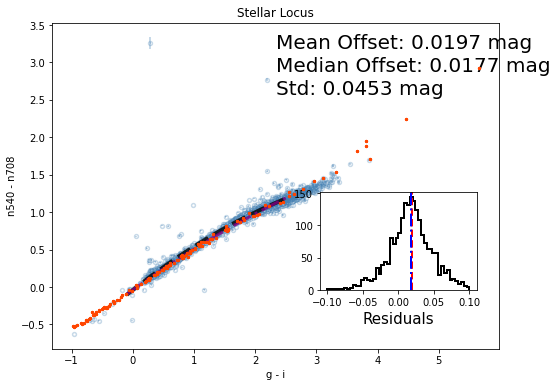

12366
2777


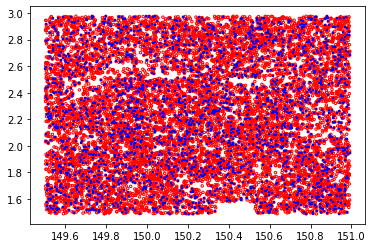

2777


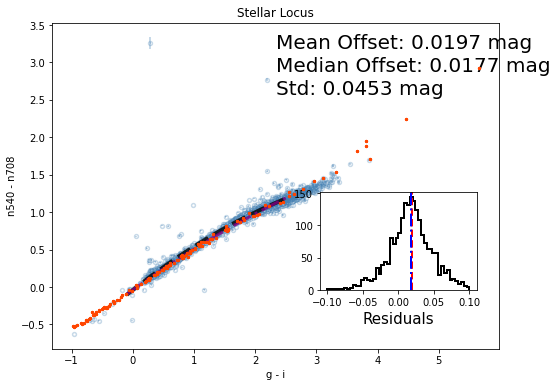

12353
2777


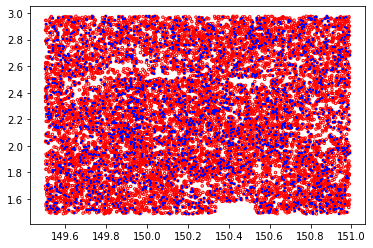

2777


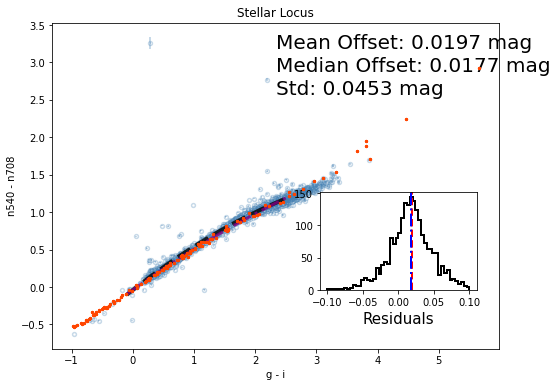

12336
2777


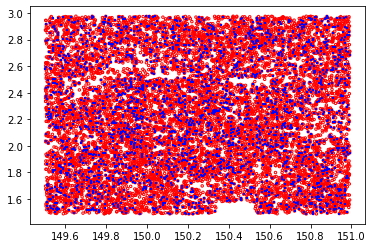

2777


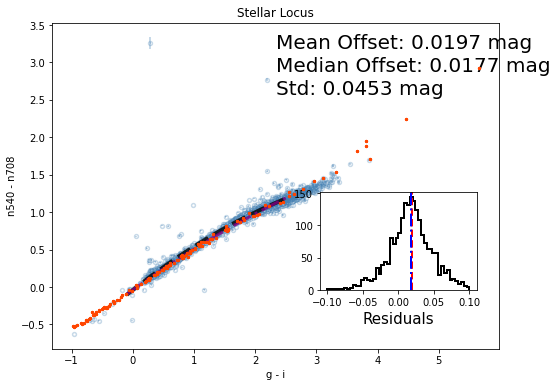

12319
2776


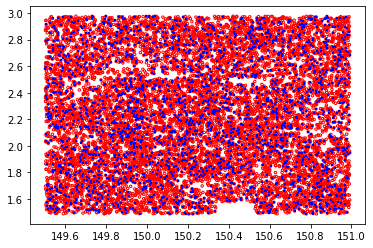

2776


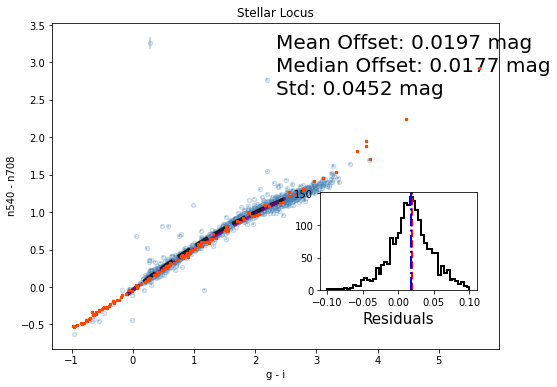

12294
2775


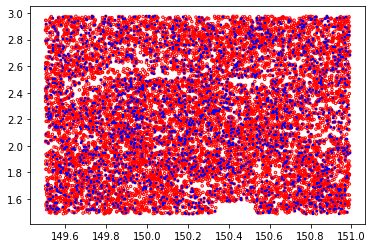

2775


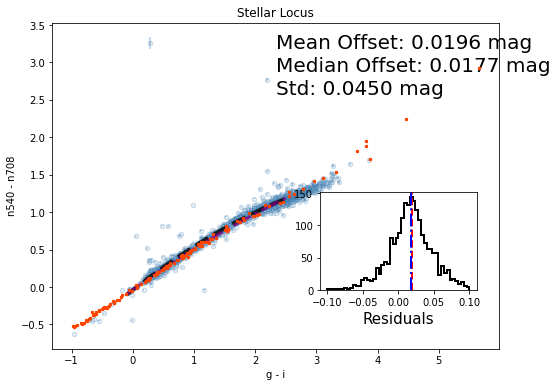

12247
2774


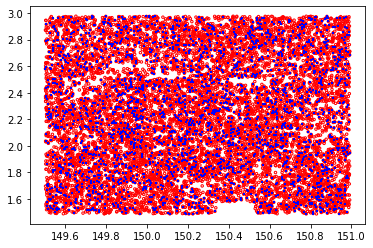

2774


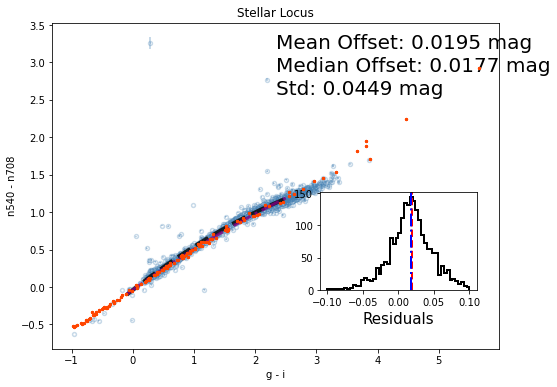

12176
2770


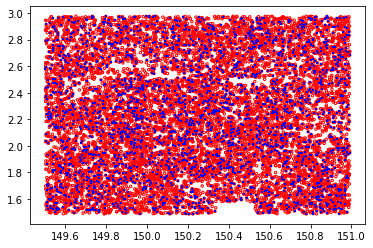

2770


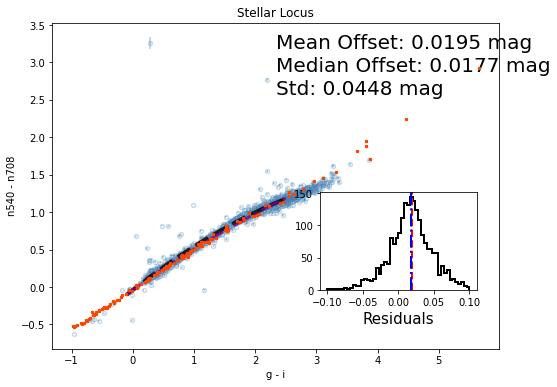

11985
2767


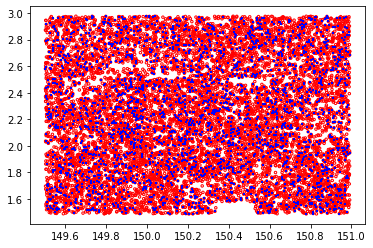

2767


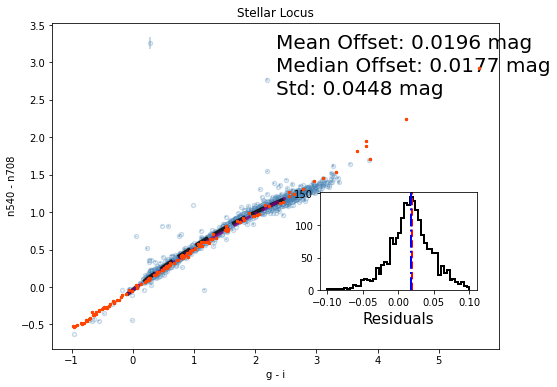

11960
2765


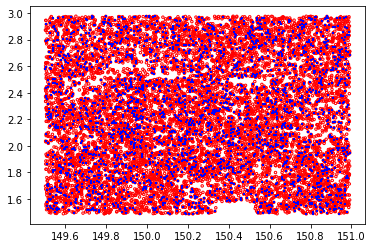

2765


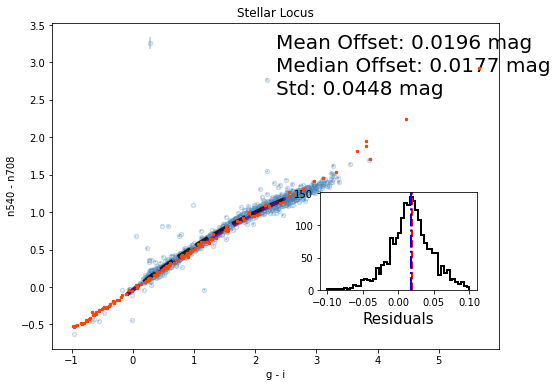

11916
2760


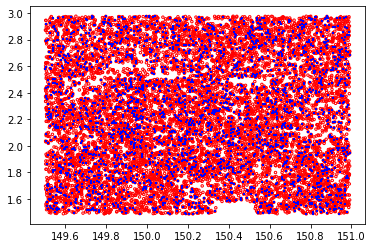

2760


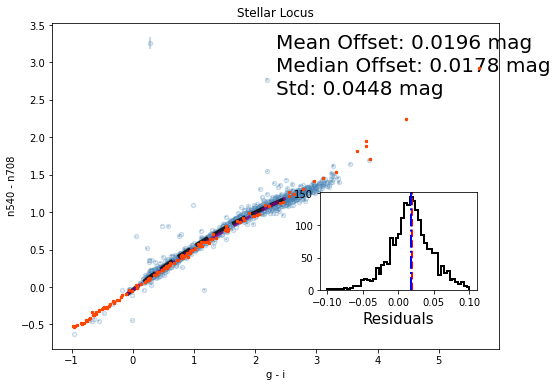

11873
2758


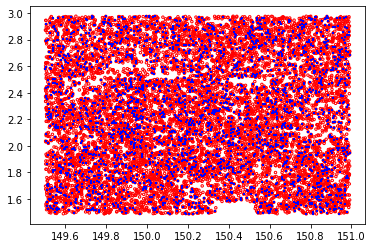

2758


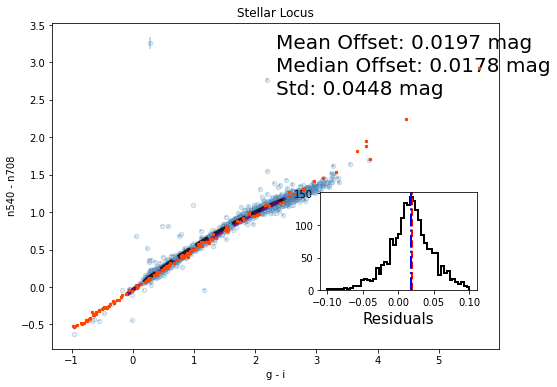

11828
2758


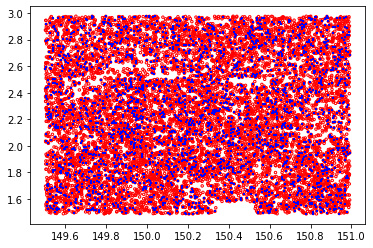

2758


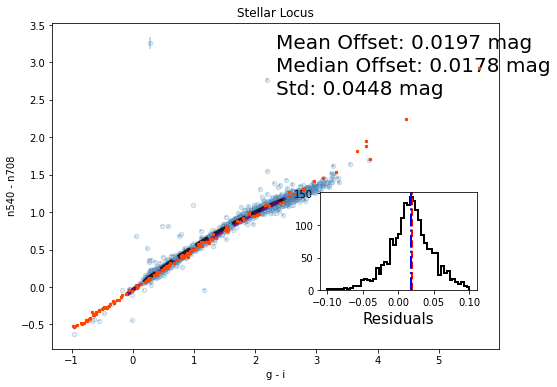

11752
2754


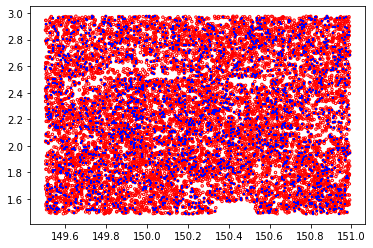

2754


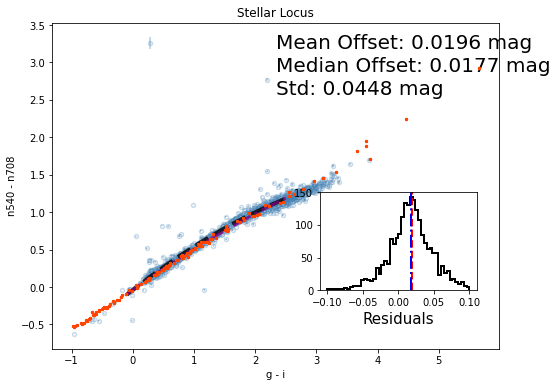

11677
2747


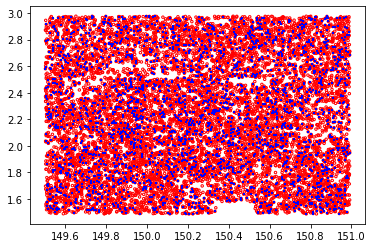

2747


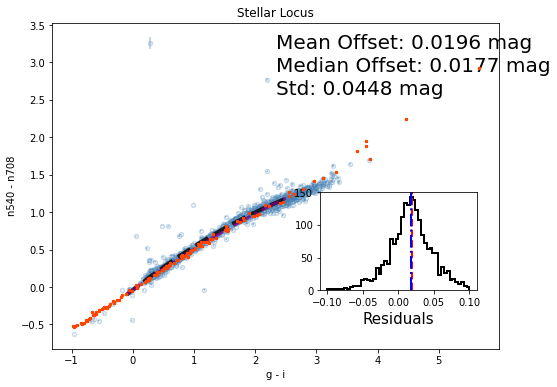

11571
2740


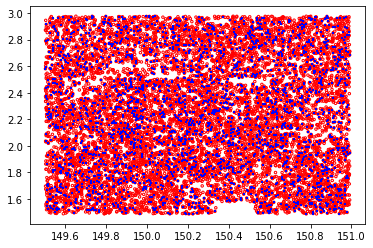

2740


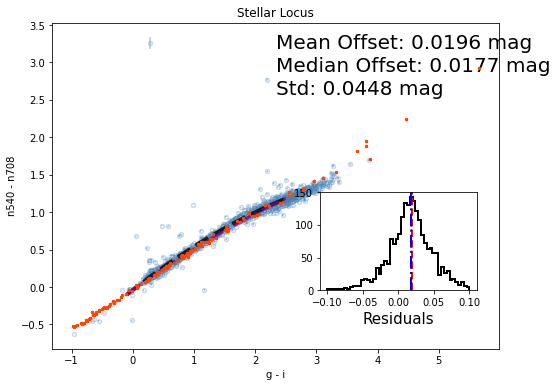

11410
2720


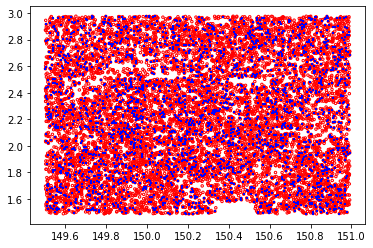

2720


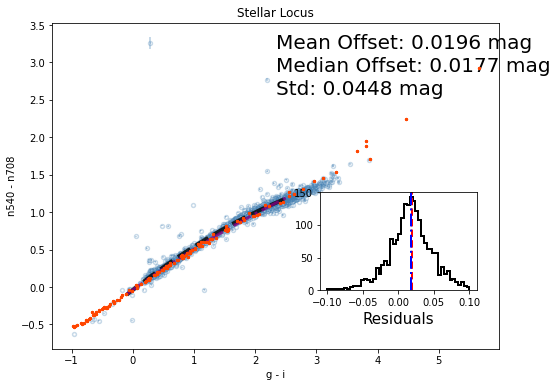

11072
2679


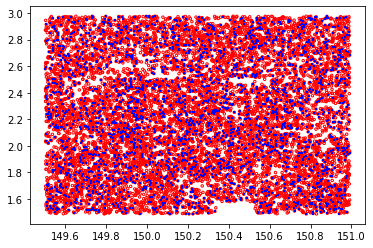

2679


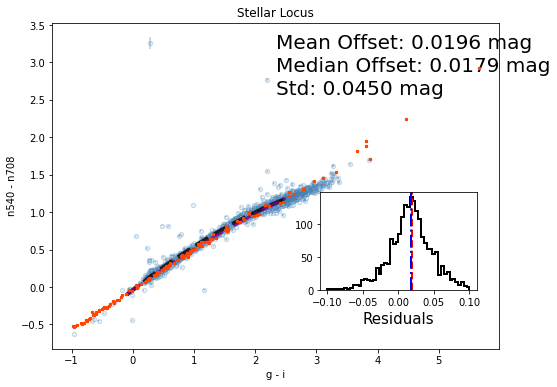

11016
2673


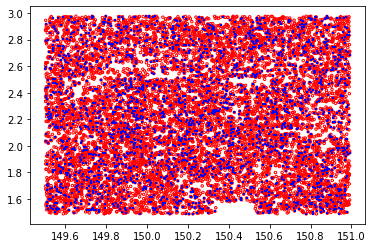

2673


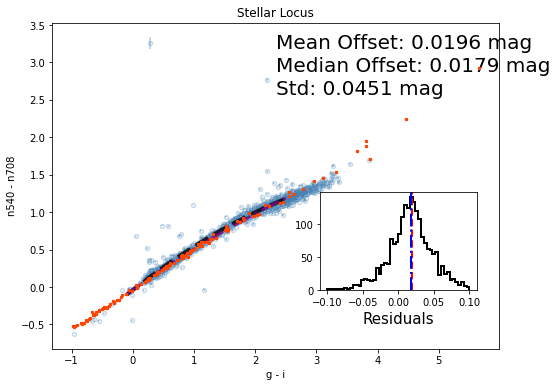

10945
2662


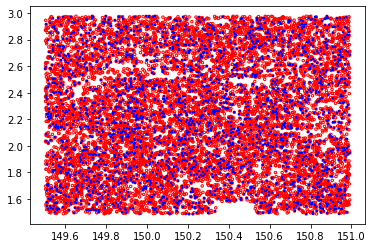

2662


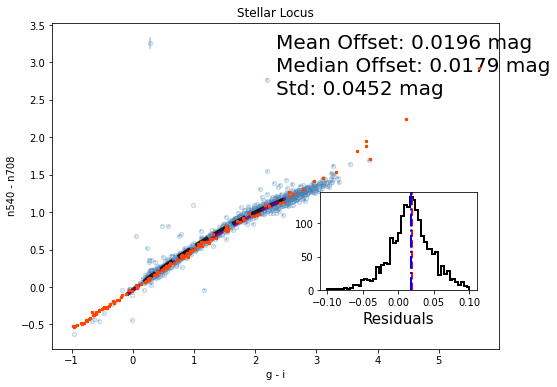

10868
2654


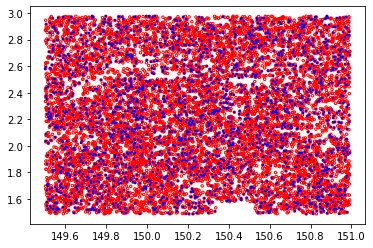

2654


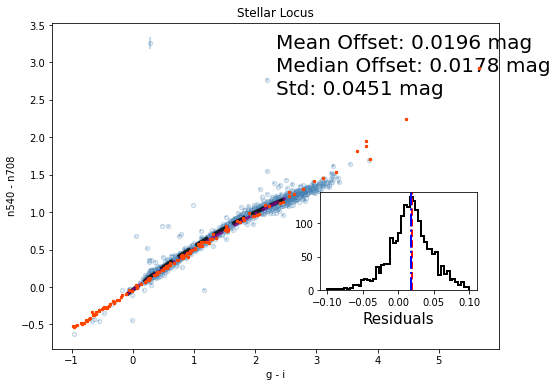

10799
2645


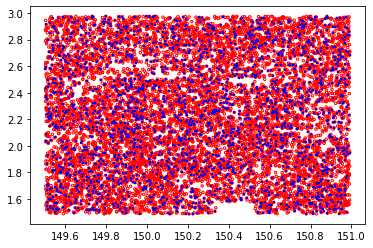

2645


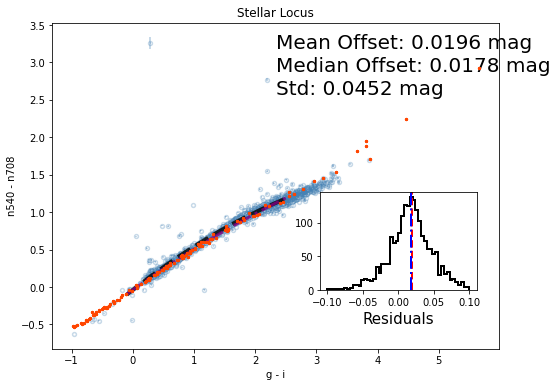

10702
2633


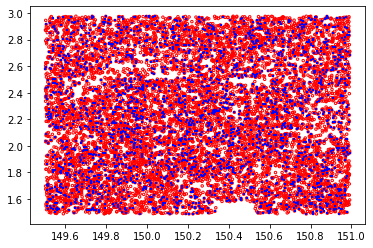

2633


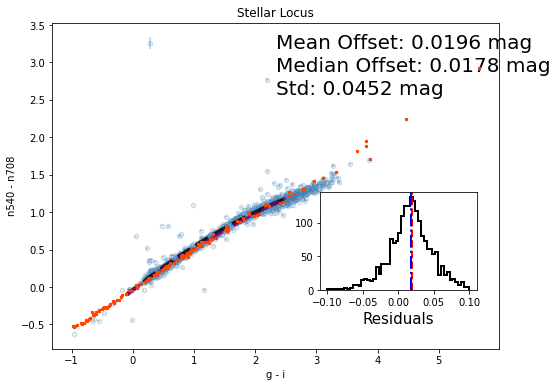

10546
2603


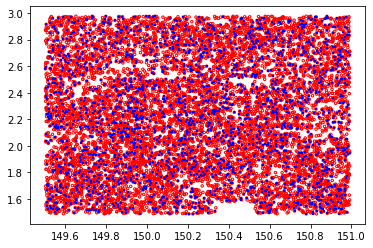

2603


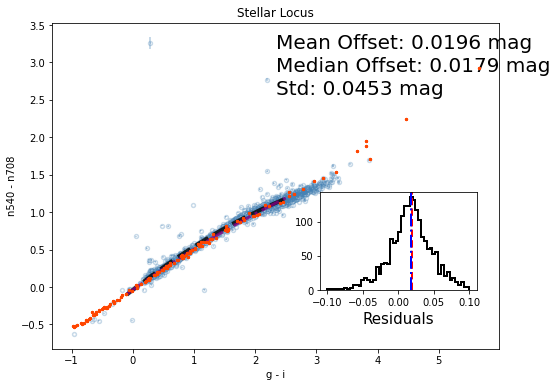

10324
2563


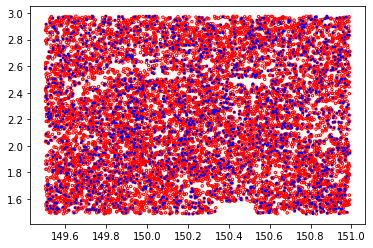

2563


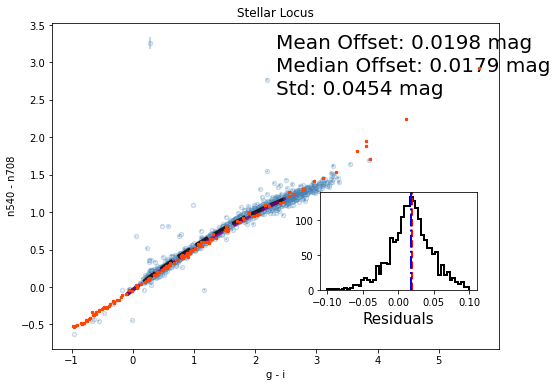

10020
2524


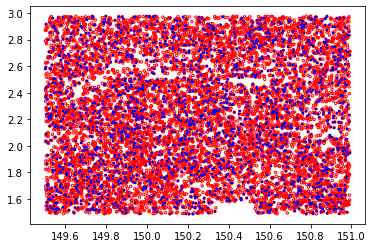

2524


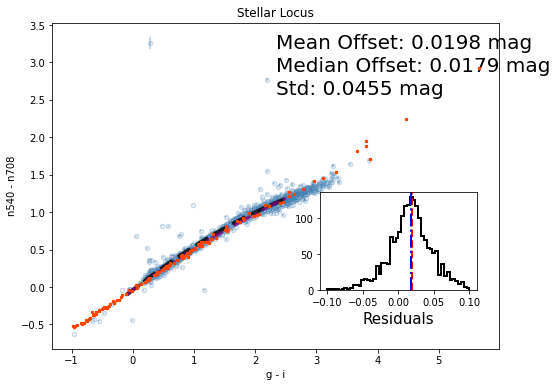

9428
2456


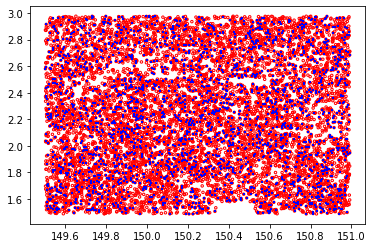

2456


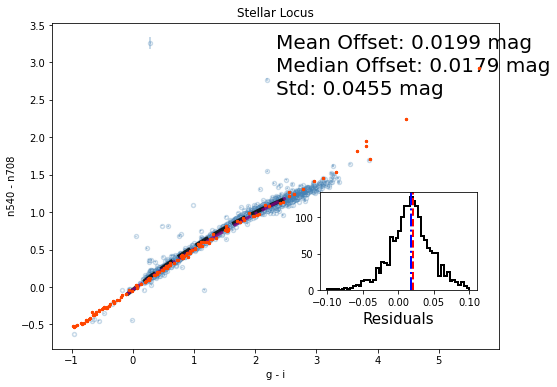

9317
2440


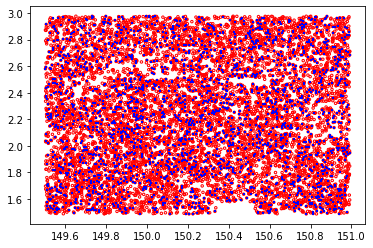

2440


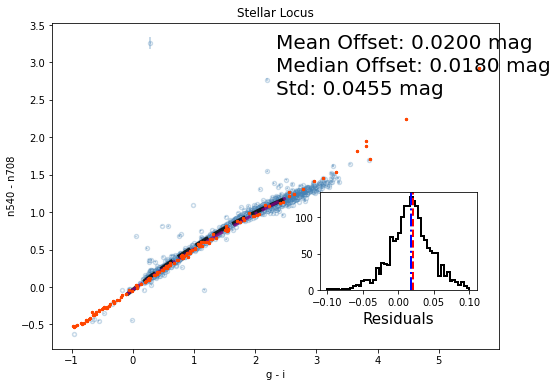

9223
2432


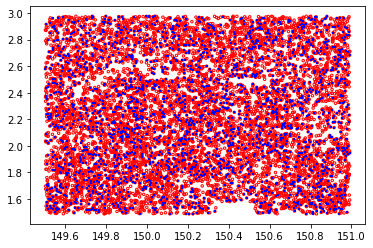

2432


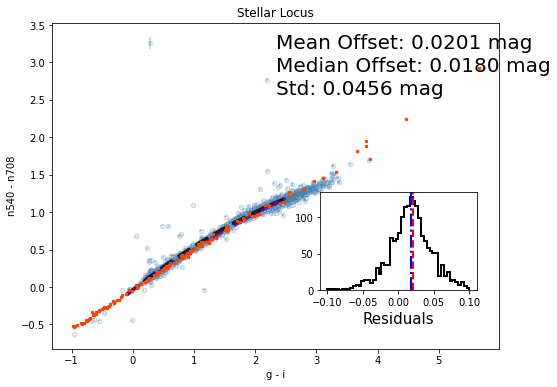

9085
2410


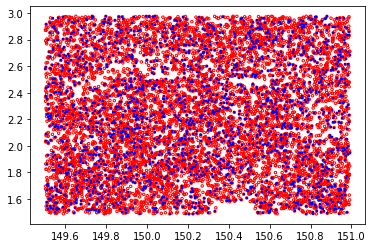

2410


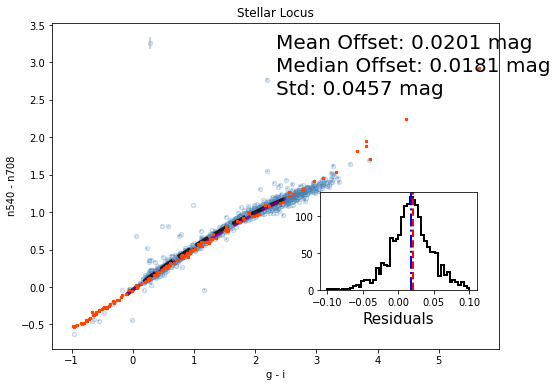

8952
2394


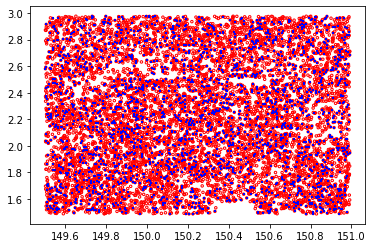

2394


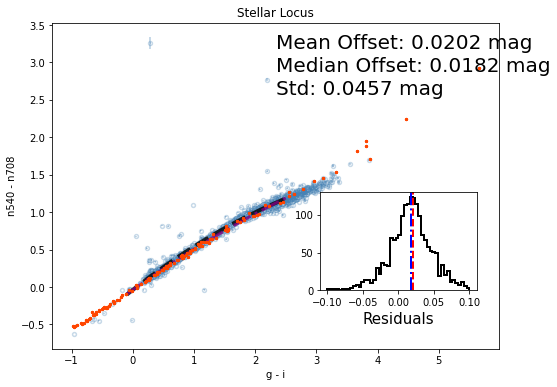

8740
2375


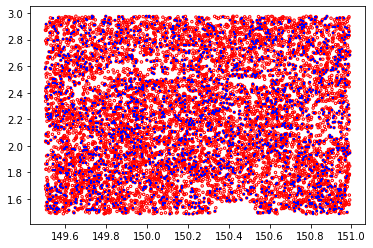

2375


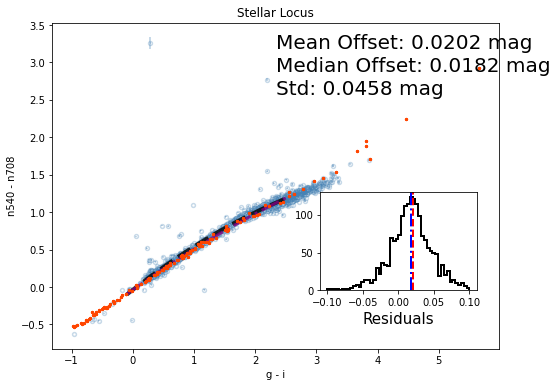

8501
2344


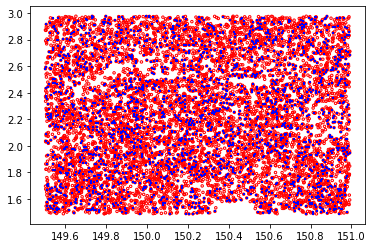

2344


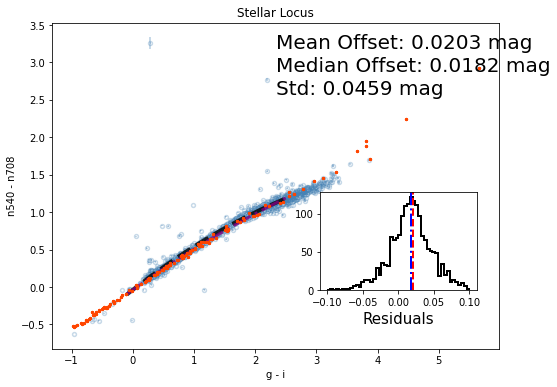

8169
2304


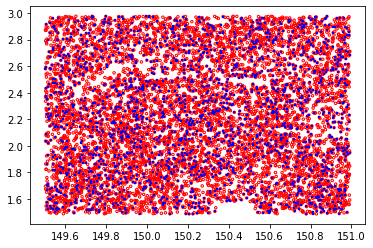

2304


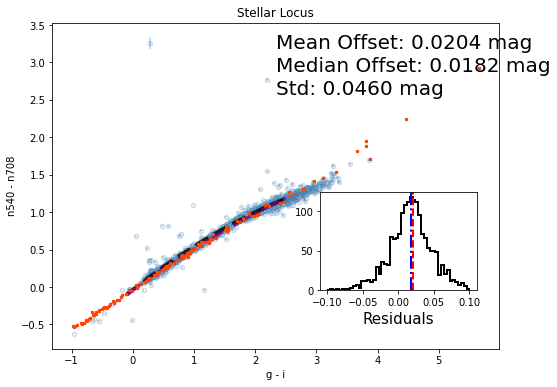

7779
2258


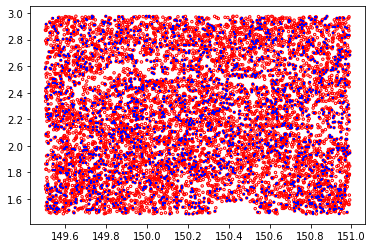

2258


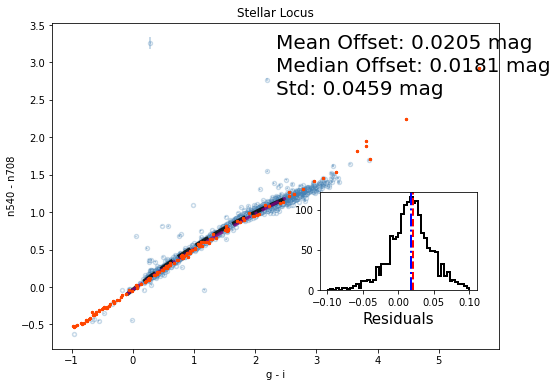

7111
2160


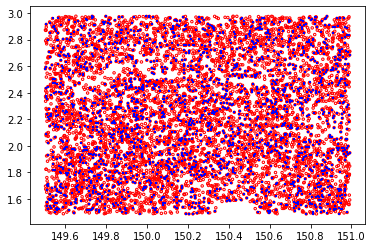

2160


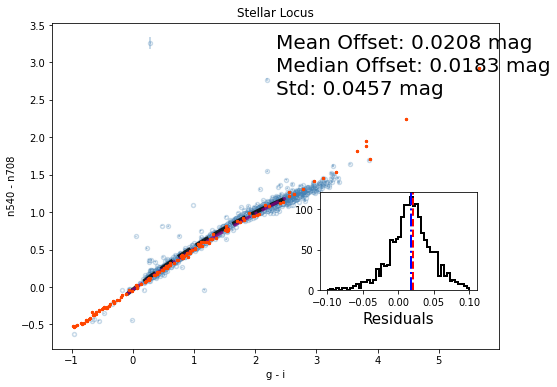

In [81]:
thresholds=np.concatenate([.1**i*np.arange(9,0,-1) for i in range(1,5)],axis=0)
evaluation=[[],[],[]]
n=[]
for i in range(len(thresholds)):
    t=thresholds[i]
    merian_photocal.blended_cut(t)
    n.append(len(merian_photocal.star_catalog_use))
    fig, ax = plotter.plot_stellar_locus('g i n540 n708',merian_photocal)
    fig, ax,mean,median,std = plotter.fit_stellar_locus([-0.1, 2.5, 0.0, 1.2],[0.6, 0.18, 0.35, 0.3],return_evaluation=True)
    plt.show()
    evaluation[0].append(mean)
    evaluation[1].append(median)
    evaluation[2].append(std)

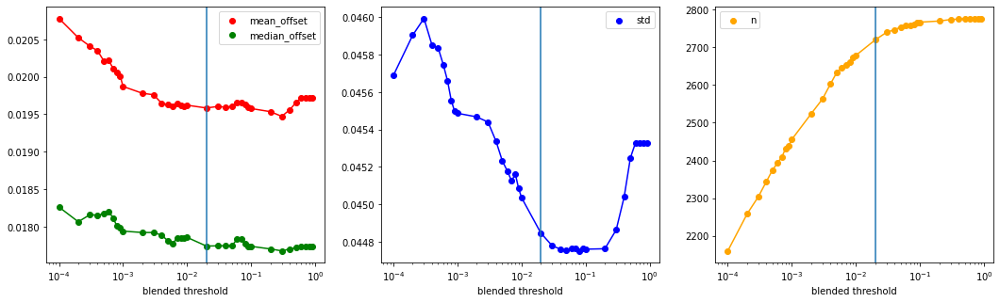

In [82]:
plt.figure(figsize=(18,5))
plt.subplot(131)
plt.scatter(thresholds,evaluation[0],c='r',label='mean_offset')
plt.plot(thresholds,evaluation[0],c='r')
plt.scatter(thresholds,evaluation[1],c='g',label='median_offset')
plt.plot(thresholds,evaluation[1],c='g')
plt.axvline(0.02)
plt.legend()
plt.xlabel('blended threshold')
plt.xscale('log')

plt.subplot(132)
plt.scatter(thresholds,evaluation[2],c='b',label='std')
plt.plot(thresholds,evaluation[2],c='b')
plt.axvline(0.02)
plt.legend()
plt.xlabel('blended threshold')
plt.xscale('log')

plt.subplot(133)
plt.scatter(thresholds,n,c='orange',label='n')
plt.plot(thresholds,n,c='orange')
plt.axvline(0.02)
plt.legend()
plt.xlabel('blended threshold')
plt.xscale('log')
plt.show()